In [67]:
%matplotlib inline
from matplotlib import rcParams
rcParams["savefig.dpi"] = 200

In [68]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage

In [69]:
import celerite
from celerite import terms
from celerite.modeling import Model, ConstantModel
import muhz2days

In [70]:
#K2-97
#data = np.loadtxt('/Users/samuelgrunblatt/Desktop/reinflationpaper/K2-97/211351816.dat.ts')


#EPIC2287
data = np.loadtxt('/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC228754001/228754001.dat.ts')
# f = open('/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC228754001/ep228754001simultfit.csv') #simult
# data = f.read().split() #simult
# ftime = data[7::4] #simult
# fflux = data[8::4] #simult
# times = np.array([float(i[:-1]) for i in fflux]) #simult
# flux = np.array([float(i[:-1]) for i in ftime]) #simult


#EPIC20113
#data = np.loadtxt('/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC201132839/201132839.dat.ts')

#Kep-643
#data = np.loadtxt('/Users/samuelgrunblatt/Desktop/reinflationpaper/KIC7277317/KIC7277317.dat.ts')

In [71]:
#K2-97
t = data[:,0]
y = (data[:,1]-1)# * 1e3

#EPIC2287
#t = times - times[0]
#y = (flux-1) #* 1e3
#t = t[1:]
#y = y[1:] #even # of datapts


yerr = np.median(np.abs(np.diff(y)))
print(yerr*1e6)

162.06


In [72]:
muhzconv = 1e6 / (3600*24)

def muhz2idays(muhz):
    return muhz / muhzconv

def muhz2omega(muhz):
    return muhz2idays(muhz) * 2.0 * np.pi

def idays2muhz(idays):
    return idays * muhzconv

def omega2muhz(omega):
    return idays2muhz(omega / (2.0 * np.pi))

omega = np.linspace(1, 300, 1000)
freqmuhz = omega2muhz(omega)
freqidays = muhz2idays(freqmuhz)

In [73]:
t

array([  0.00000000e+00,   2.04000000e-02,   4.08000000e-02, ...,
         6.90389000e+01,   6.90594000e+01,   6.90798000e+01])

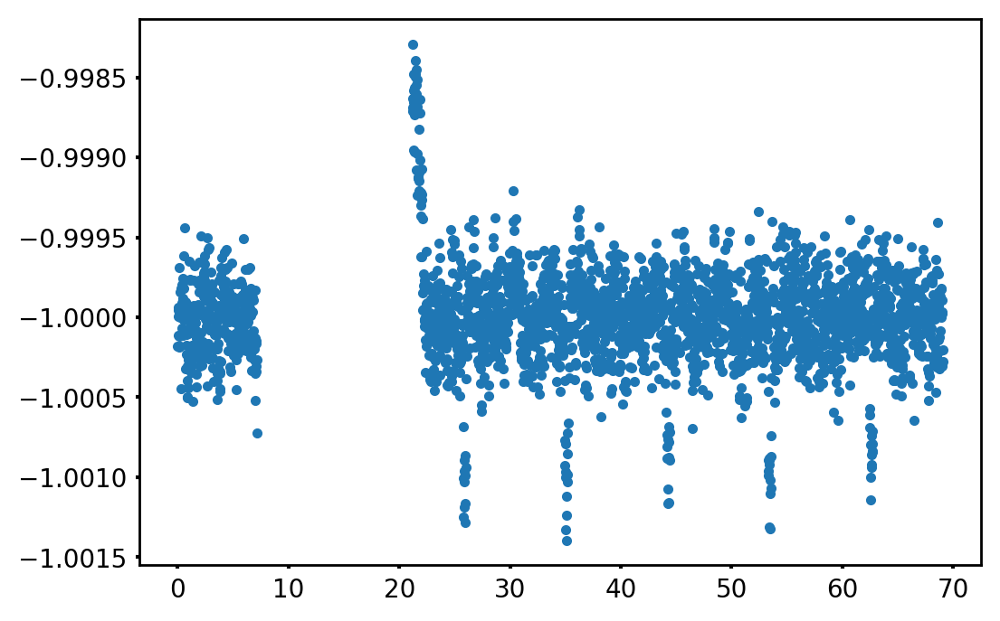

(6.5, 8.5)

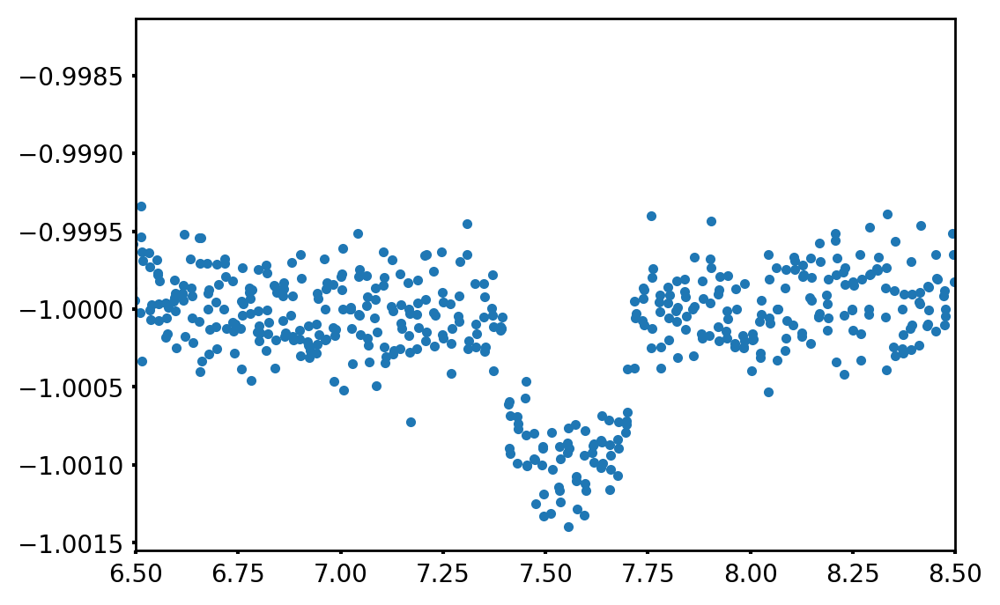

In [74]:
#plot the lightcurve

plt.plot(t,y, '.')
plt.show()
#plt.xlim(20,25)
plt.clf()
plt.plot(t%9.175,y,'.')
plt.xlim(6.5,8.5)

start lengths: 2512 2512
1.2511999999999999
new lens: 2512 2512
finish lengths: 2512 2512


/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:46: DeprecationWarning: numpy boolean negative, the `-` operator, is deprecated, use the `~` operator or the logical_not function instead.
/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:47: DeprecationWarning: numpy boolean negative, the `-` operator, is deprecated, use the `~` operator or the logical_not function instead.


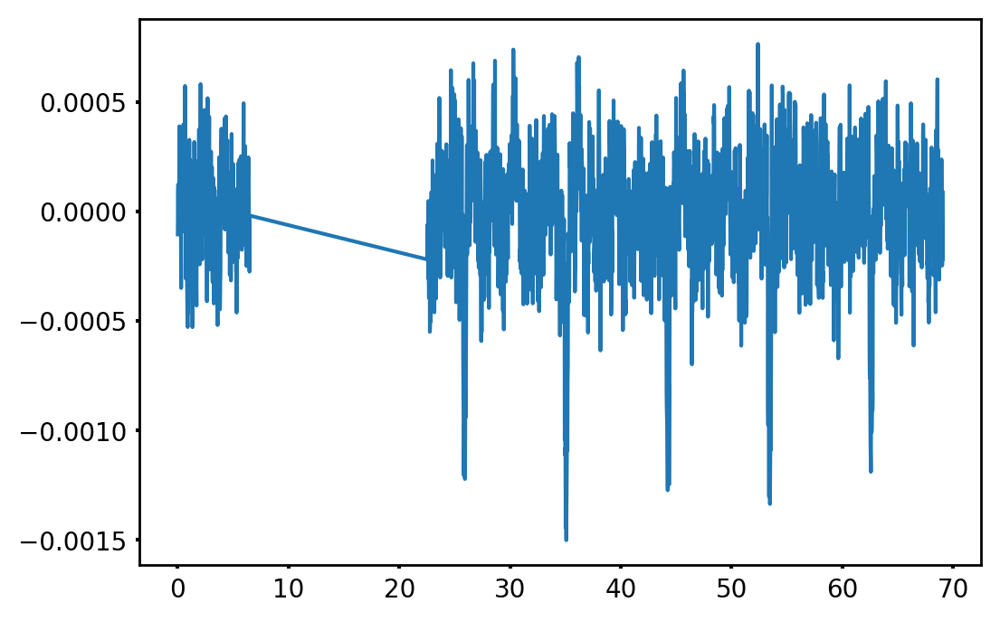

(6.6, 8.4)

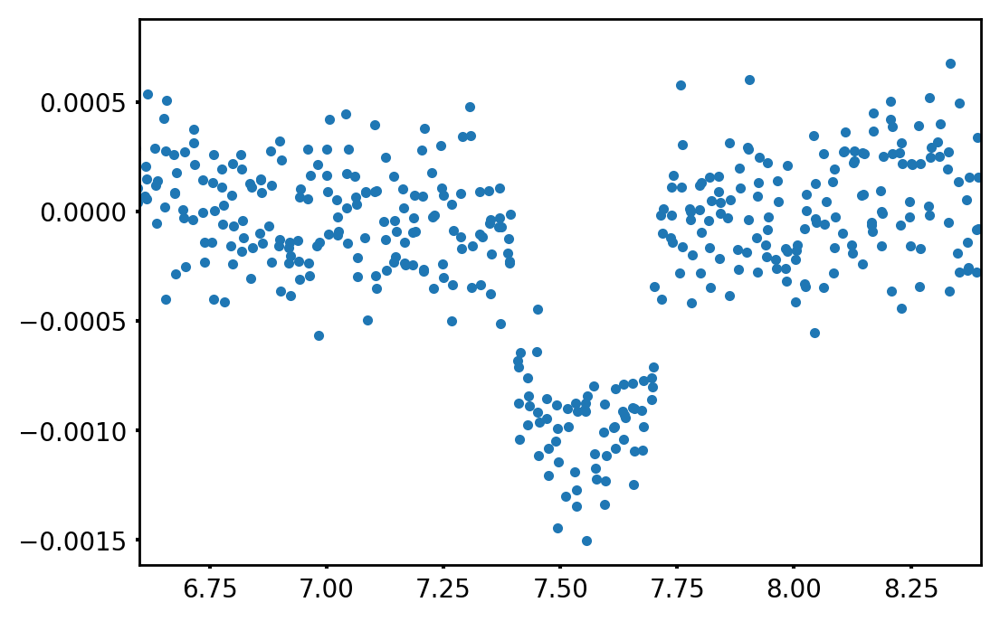

In [77]:
#sigma clip and smooth if necessary
print("start lengths:", len(t), len(y))
#sigmaclip and remove nans
sigclip = 9.5
loopsize = 10000
oldlentimes = len(t)+1
while oldlentimes > len(t):
    newtimes = np.array([])
    newfluxes = np.array([])
    j=0
    print(len(t) / loopsize + 1)
    while j < len(t) / loopsize + 1:
        dellist = []
        piecet = t[loopsize*j:loopsize*j+loopsize]
        piece = y[loopsize*j:loopsize*j+loopsize]
        #print piecet, piece
        for k in range(len(piece)):
            if abs(piece[k] - np.nanmean(piece)) > sigclip*np.nanstd(piece) or np.isnan(piece[k]) == True:
                #print "sigclip:",sigclip*np.nanstd(piece)
                #print "distance from mean:", piece[k] - np.nanmean(piece)
                dellist.append(k)
        #print dellist
        piecet = np.delete(piecet,dellist)
        piece = np.delete(piece,dellist)
        newtimes = np.append(newtimes, piecet)
        newfluxes = np.append(newfluxes, piece)
        #print sctimes[i], scfluxes[i]
        j=j+1
    print("new lens:", len(newtimes), len(newfluxes))
    oldlentimes = len(t)
    #print "oldlentimes:", oldlentimes
    t = newtimes
    y = newfluxes

#print len(times[i])
#times[i] = newtimes
#corrfluxes[i] = newfluxes
print("finish lengths:", len(t), len(y))

#median filter and remove outliers
y -= scipy.ndimage.filters.median_filter(y, size=150) #50 datapts ~ 1 day

# #2287: remove edge effect during midcampaign break
edgemask = (t > 6.5) * (t < 22.5)
# #print(-edgemask)
t = t[-edgemask]
y = y[-edgemask]

# # #k297: remove edge effect during midcampaign break
# edgemask = (t < 0.5)
# # #print(-edgemask)
# t = t[-edgemask]
# y = y[-edgemask]



#plot the lightcurve
plt.plot(t,y)
plt.show()
#plt.xlim(20,25)
plt.clf()
plt.plot(t%9.1752,y,'.')
plt.xlim(6.6,8.4)

Best-fitting stellar parameters
zpt: 8.10239972973868e-06

Best-fitting planet parameters for planet 0
period: 9.176053982927026
T0: 7.549755400072011
impact: 0.8496789573417795
rprs: 0.035509619533722614

{'zpt': 8.1023997297386804e-06}
{'period': 9.1760539829270265, 'T0': 7.5497554000720113, 'impact': 0.84967895734177945, 'rprs': 0.035509619533722614}
transit model shape: (2417,)


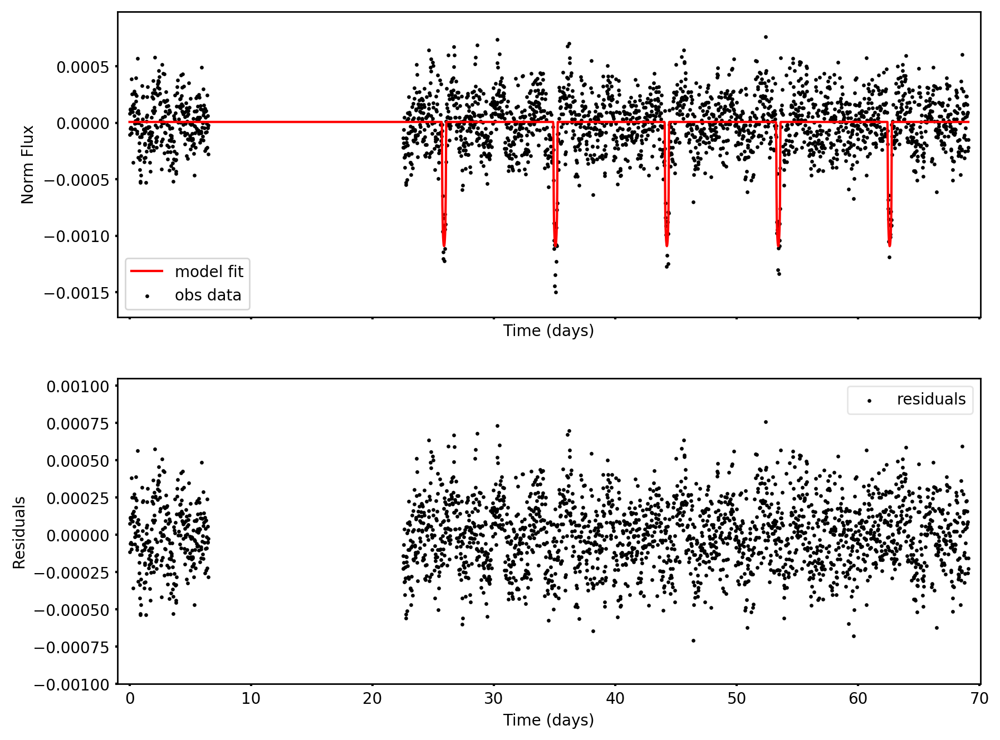

In [88]:
#bin lightcurve



#fit transit

from ktransit import FitTransit
import ktransit


fitT = FitTransit()

#K2-97
#fitT.add_guess_star(rho=0.02, zpt=0, ld1=0.6505,ld2=0.1041) 
#fitT.add_guess_planet(T0=1.5, period=8.406, impact=0.94, rprs=0.03) #simult, sff


#EPIC2287
fitT.add_guess_star(rho=0.0264, zpt=0, ld1=0.6505,ld2=0.1041) 
fitT.add_guess_planet(T0=7.5, period=9.17, impact=0.8, rprs=0.03, ecosw=0.0, esinw=0.0) #simult, sff


#EPIC20113
#fitT.add_guess_star(rho=0.008, zpt=0, ld1=0.6505,ld2=0.1041) 
#fitT.add_guess_planet(T0=3.8, period=8.66, impact=0.4, rprs=0.017) #simult, sff


#Kep-643
#fitT.add_guess_star(rho=0.08, zpt=0, ld1=0.6505,ld2=0.1041) 
#fitT.add_guess_planet(T0=14.5, period=16.339, impact=0.67, rprs=0.038) #simult, sff

#fitT.add_guess_planet(period=0.5)
fitT.add_data(time=t,flux=np.array(y))#*1e-3)
#fitT.add_data(time=M.time, flux = tmod)

vary_star = ['zpt']#, 'ld1', 'ld2']      # free stellar parameters
vary_planet = (['period',       # free planetary parameters
        'T0', 'impact',# 'esinw', 'ecosw',
        'rprs'])                # free planet parameters are the same for every planet you model

fitT.free_parameters(vary_star, vary_planet)
fitT.do_fit()                   # run the fitting

fitT.print_results()            # print some results
res=fitT.fitresultplanets
res2=fitT.fitresultstellar
print(res2)
print(res['pnum0'])
print("transit model shape:", fitT.transitmodel.shape)

fig = ktransit.plot_results(t,y,fitT.transitmodel)
#fig = ktransit.plot_results(M.time, tmod,fitT.transitmodel)
#fig.savefig('my_beautiful_fit.png')
#fig.show()

In [89]:
class TransitModel(Model):
    parameter_names = ("log_ror", "log_rho", "log_T0", "log_per", "log_imp")#, "ecosw", "esinw")
    
    def get_value(self, t):
        
         #make transit model
        M=ktransit.LCModel()
        M.add_star(
            rho=np.exp(self.log_rho), # mean stellar density in cgs units
            ld1=0.6505, # ld1--4 are limb darkening coefficients 
            ld2=0.1041, # if only ld1 and ld2 are non-zero then a quadratic limb darkening law is used
            #ld1=theta[8],
            #ld2=theta[9],
            ld3=0.0, # if all four parameters are non-zero we use non-linear flavour limb darkening
            ld4=0.0, 
            dil=0.0, # a dilution factor: 0.0 -> transit not diluted, 0.5 -> transit 50% diluted
            zpt=0.0  # a photometric zeropoint, incase the normalisation was wonky
            )
        M.add_planet(
            T0=np.exp(self.log_T0),     # a transit mid-time  
            period=np.exp(self.log_per), # an orbital period in days
            impact=np.exp(self.log_imp), # an impact parameter
            rprs=np.exp(self.log_ror),   # planet stellar radius ratio  
            #ecosw=self.ecosw,  # eccentricity vector
            #esinw=self.esinw,
            occ=0.0)    # a secondary eclipse depth in ppm

    
        M.add_data(time=t)

        return M.transitmodel #* 1e3

In [158]:
# lns00 = -20.781267198750733 +0.09328474450254376 -0.08489937328325681 
# lnomega00 = 3.3944723767512914 +0.0630959551396848 -0.05465773975244126
# lns01 = -35.826266227783904 +1.874860458984017 -2.6335047944232315 
# lnq1 = 10.120703314795612 +2.7233337082758666 -2.180329911762068
# log(muhztoomega(numax)) = 4.766785445589564 +0.03996879252898555 -0.0002479193183546613
# lnsigma = -25.50807821860027 +2.982851813657465 -3.1184204085656866 
# lnrprs = -3.6368294585143692 +0.03796639076192676 -0.0378031821690783


#set the GP parameters



Q = 1.0 / np.sqrt(2.0)
w0 = muhz2omega(13)
S0 = np.var(y) / (w0*Q)
kernel = terms.SHOTerm(log_S0=np.log(S0), log_Q=np.log(Q), log_omega0=np.log(w0),
                       bounds=[(-25, 0), (-15, 15), (np.log(muhz2omega(3)), np.log(muhz2omega(50)))]) #omega upper bound: 275 muhz
kernel.freeze_parameter("log_Q") #to make it a Harvey model

Q = 1.0 / np.sqrt(2.0)
w0 = muhz2omega(61.0)
S0 = np.var(y) / (w0*Q)
kernel += terms.SHOTerm(log_S0=np.log(S0), log_Q=np.log(Q), log_omega0=np.log(w0),
                   bounds=[(-25, 0), (-15, 15), (np.log(muhz2omega(30)), np.log(muhz2omega(1000)))])
kernel.freeze_parameter("terms[1]:log_Q") #to make it a Harvey model

# numax = 250
# dnu = 18.76
# for i in range(1):
#     Q = 2000.0
#     w0 = muhz2omega(300)#muhz2omega(numax+(dnu/2)*(i-3)) #peak of oscillations at 220 muhz
#     S0 = np.var(y) / (w0*Q)
#     kernel += terms.SHOTerm(log_S0=np.log(S0), log_Q=np.log(Q), log_omega0=np.log(w0),
#                        bounds=[(-40, 0), (0, 15), (-5, 10)])
#     kernel.freeze_parameter("terms["+str(i)+"]:log_omega0")

Q = np.exp(3.0)
w0 = muhz2omega(250) #peak of oscillations at 220 muhz
S0 = np.var(y) / (w0*Q)
kernel += terms.SHOTerm(log_S0=np.log(S0), log_Q=np.log(Q), log_omega0=np.log(w0),
                      bounds=[(-40, 0), (0.5, 4.2), (np.log(muhz2omega(200)), np.log(muhz2omega(280)))])
#kernel.freeze_parameter("terms[1]:log_omega0")


#Q = 200.0
#w0 = muhz2omega(270) #peak of oscillations at 220 muhz
#S0 = np.var(y) / (w0*Q)
#kernel += terms.SHOTerm(log_S0=np.log(S0), log_Q=np.log(Q), log_omega0=np.log(w0),
#                       bounds=[(-40, 0), (0, 15), (-5, 10)])
#kernel.freeze_parameter("terms[3]:log_omega0")




#add more params which are related by numax/dnu relations (eqns 66, 67 in celerite paper)?


mean = TransitModel(log_ror=np.log(res['pnum0']['rprs']), log_rho=np.log(0.008),
                    log_T0=np.log(res['pnum0']['T0']), log_per=np.log(res['pnum0']['period']),
                    log_imp=np.log(res['pnum0']['impact']), 
                    bounds=[(-5, 0), (-6.0,-3.0), (np.log(res['pnum0']['T0']-1), np.log(res['pnum0']['period'])), (1,3),(np.log(0.01),np.log(1.1))])#, ((np.log(res['pnum0']['T0']-5),
                    #np.log(res['pnum0']['T0']+5))-1,1), (-1,1)]) # ecosw=res['pnum0']['ecosw'], esinw=res['pnum0']['esinw'], 
#mean.freeze_parameter("log_rho")
mean.freeze_parameter("log_per")
#mean.freeze_parameter("log_T0")
#mean.freeze_parameter("log_imp")

print(np.log(np.mean(yerr)**2/len(t)))
#lwn = ConstantModel(np.log(np.mean(yerr)**2/len(t)), bounds=[(-30, -5)])
lwn = np.log(np.mean(yerr**2)/len(t))

kernel += terms.JitterTerm(log_sigma=-10, bounds=[(-20,20)])

gp = celerite.GP(kernel, mean=mean, fit_mean=True)#, log_white_noise=np.log(np.mean(yerr)**2/len(t)), fit_white_noise=False)
gp.compute(t, yerr)
print("Initial log likelihood: {0}".format(gp.log_likelihood(y)))
gp.get_parameter_dict()

-25.2453702226
Initial log likelihood: 16437.350704725228


OrderedDict([('kernel:terms[0]:log_S0', -17.976981415373469),
             ('kernel:terms[0]:log_omega0', 1.954058820698755),
             ('kernel:terms[1]:log_S0', -19.522905922085243),
             ('kernel:terms[1]:log_omega0', 3.4999833274105296),
             ('kernel:terms[2]:log_S0', -24.280066566054153),
             ('kernel:terms[2]:log_Q', 3.0),
             ('kernel:terms[2]:log_omega0', 4.9105703810994648),
             ('kernel:terms[3]:log_sigma', -10.0),
             ('mean:log_ror', -3.3379516464263412),
             ('mean:log_rho', -4.8283137373023015),
             ('mean:log_T0', 2.0215151653946726),
             ('mean:log_imp', -0.16289669808830995)])

In [120]:
#find max likelihood params

from scipy.optimize import minimize

def neg_log_like(params, y, gp):
    gp.set_parameter_vector(params)
    ll = gp.log_likelihood(y)
    if not np.isfinite(ll):
        return 1e10
    return -ll

initial_params = gp.get_parameter_vector()
bounds = gp.get_parameter_bounds()

r = minimize(neg_log_like, initial_params, method="L-BFGS-B", bounds=bounds, args=(y, gp))
gp.set_parameter_vector(r.x)
print(r)

      fun: -17168.67979125309
 hess_inv: <12x12 LbfgsInvHessProduct with dtype=float64>
      jac: array([  0.60899765,   0.09240466,  -1.96014298,  -1.92922016,
         0.71377144,   0.26520866,   0.14078978,   0.08403731,
        -5.32418198,  -0.35070116, -40.20876077,   3.88354238])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 2561
      nit: 154
   status: 0
  success: True
        x: array([-19.48850322,   1.34670328, -21.10829393,   3.47503926,
       -27.97454553,   3.09474136,   4.87834576, -12.38203754,
        -3.41898599,  -3.00000474,   2.02164844,  -0.27124   ])


In [159]:
gp.get_parameter_dict()

OrderedDict([('kernel:terms[0]:log_S0', -17.976981415373469),
             ('kernel:terms[0]:log_omega0', 1.954058820698755),
             ('kernel:terms[1]:log_S0', -19.522905922085243),
             ('kernel:terms[1]:log_omega0', 3.4999833274105296),
             ('kernel:terms[2]:log_S0', -24.280066566054153),
             ('kernel:terms[2]:log_Q', 3.0),
             ('kernel:terms[2]:log_omega0', 4.9105703810994648),
             ('kernel:terms[3]:log_sigma', -10.0),
             ('mean:log_ror', -3.3379516464263412),
             ('mean:log_rho', -4.8283137373023015),
             ('mean:log_T0', 2.0215151653946726),
             ('mean:log_imp', -0.16289669808830995)])

/Users/samuelgrunblatt/Desktop/asterointimedom/lomb.py:151: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  wk1 = wk1[1:nout+1]
/Users/samuelgrunblatt/Desktop/asterointimedom/lomb.py:152: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  wk2 = wk2[1:nout+1]


25843


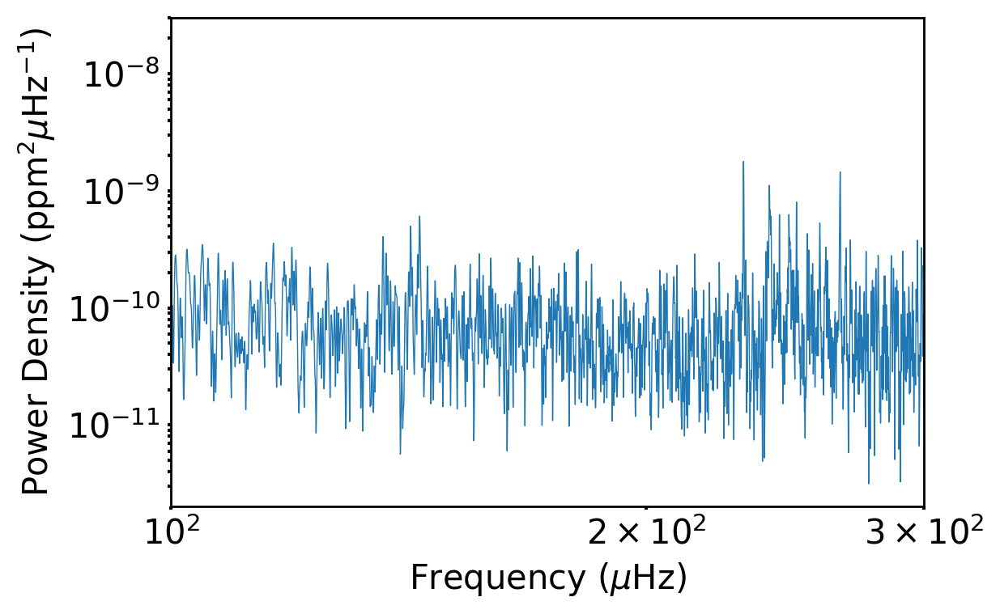

In [160]:
#plot the lightcurve
plt.plot(t,y)

#create the power spectral density

from astropy.stats import LombScargle

#model = LombScargle(t, y*1e-3)
model = LombScargle(t, y)
power_ls = model.power(freqidays, method="fast", normalization="psd")
power_ls /= len(t)


#make LC, SC powspec
import lomb

osample=10.
nyq=283.
#nyq = 550

freq, amp, nout, jmax, prob = lomb.fasper(t,y, osample, 3.)
freq = 1000.*freq/86.4
binn = freq[1]-freq[0]
fts = 2.*amp*np.var(y)/(np.sum(amp)*binn)
fts = scipy.ndimage.filters.gaussian_filter(fts, 4)
use=np.where(freq < nyq+150)
freq=freq[use]
print(len(freq))
fts=fts[use]

plt.clf()
plt.loglog(freq, fts, lw=0.5)
plt.xlim(100,300)
#plt.ylim(0,1500)
plt.ylabel(r'Power Density (ppm$^{2}\mu$Hz$^{-1}$)')
plt.xlabel(r'Frequency ($\mu$Hz)')
plt.show()


SHOTerm(-17.97698141537347, -0.34657359027997275, 1.954058820698755)
SHOTerm(-19.522905922085243, -0.34657359027997275, 3.4999833274105296)
SHOTerm(-24.280066566054153, 3.0, 4.910570381099465)
JitterTerm(-10.0)


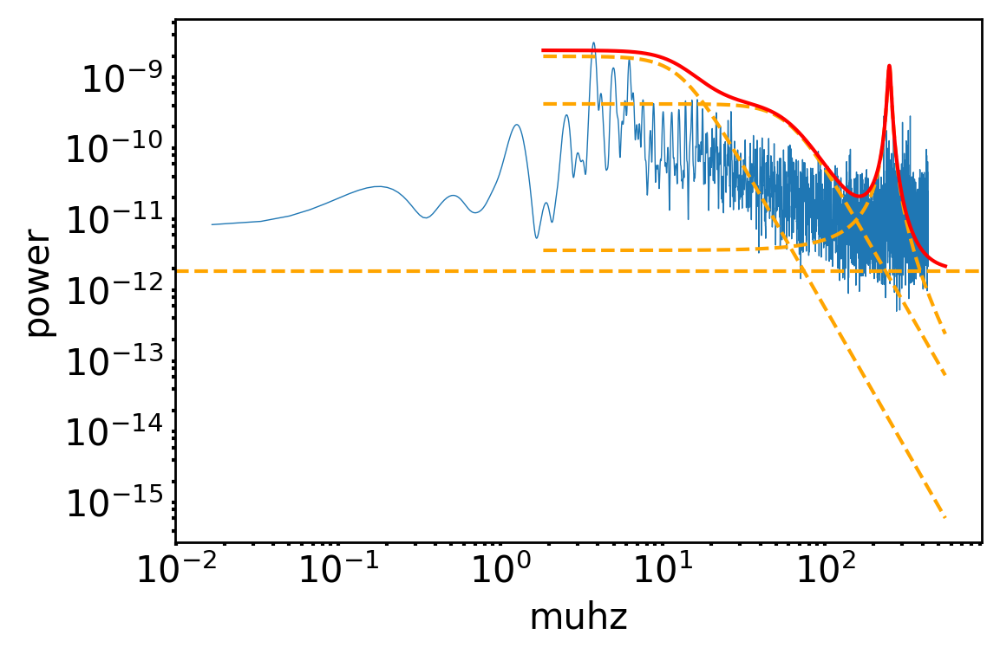

In [161]:
psd = gp.kernel.get_psd(omega)
plt.rcParams['xtick.major.size'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['xtick.minor.size'] = 1.5
plt.rcParams['xtick.minor.width'] = 1.5
plt.rcParams['ytick.major.size'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['ytick.minor.size'] = 1.5
plt.rcParams['ytick.minor.width'] = 1.5
plt.rcParams['axes.linewidth'] = 1
#how to plot 68% credible region arnd model?


#plt.plot(freqmuhz,power_ls, lw=0.7)
plt.plot(freq,fts/(2*np.pi), lw=0.5)
#plt.plot(freqmuhz, psd/(2.*np.pi))# + yerr**2/len(t)) #PS + WN 
for k in gp.kernel.terms:
    print(k)
    plt.plot(freqmuhz, k.get_psd(omega)/(2.*np.pi), "--", color='orange')
    
white_noise = (yerr**2 + gp.kernel.jitter) / len(t)
plt.axhline(white_noise / (2*np.pi), ls='--', color='orange')
plt.plot(freqmuhz, (gp.kernel.get_psd(omega) + white_noise) / (2*np.pi), color='r')

#plt.axhline(yerr**2/len(t), ls='--', color='orange')
plt.yscale("log")
#plt.ylim(5e-23,5e-9)
plt.xscale("log")
#plt.xlim(omega[0], omega[-1])
#plt.xlim(30,450)
plt.xlabel("muhz")
plt.ylabel("power");

#plt.savefig('/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC201132839/2011SHOpowspec.png')
plt.savefig('/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC228754001/SHOpowspec.png')

In [162]:
np.log(muhz2omega(10))

1.691694556231264

In [163]:
x = np.linspace(0, 80, 5000)
pred_mean, pred_var = gp.predict(y, x, return_var=True)
pred_std = np.sqrt(pred_var)

color = "#ff7f0e"

(-0.002, 0.002)

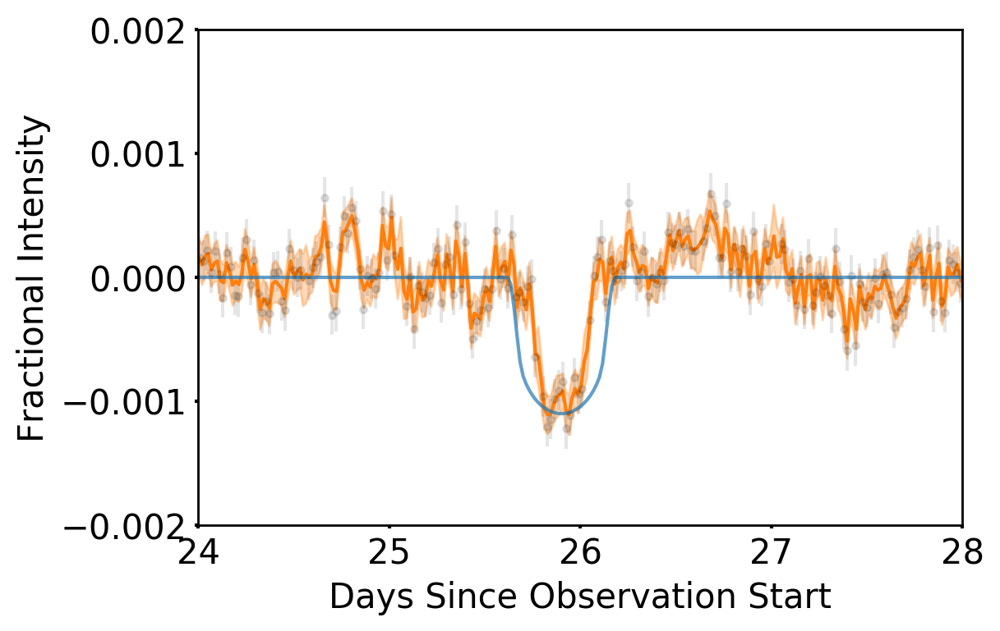

In [164]:
plt.errorbar(t, y, yerr=yerr, fmt=".k", capsize=0, alpha=0.1)
plt.plot(x, pred_mean, color=color)
plt.fill_between(x, (pred_mean+pred_std), (pred_mean-pred_std), color=color, alpha=0.3,
                 edgecolor="none")
plt.plot(x,mean.get_value(x), alpha=0.7)
plt.xlabel("Days Since Observation Start")
plt.ylabel("Fractional Intensity")
plt.xlim(24,28)
#plt.xlim(40,60)
plt.ylim(-0.002,0.002)
#plt.savefig('/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC228754001/ep2287SHOtrans.png')
#plt.savefig('/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC201132839/2011SHOtrans.png')
#plt.savefig('/Users/samuelgrunblatt/Desktop/reinflationpaper/K297SHOtrans.png')

Ks.Shape (5000, 2417) b.shape (2417, 1)


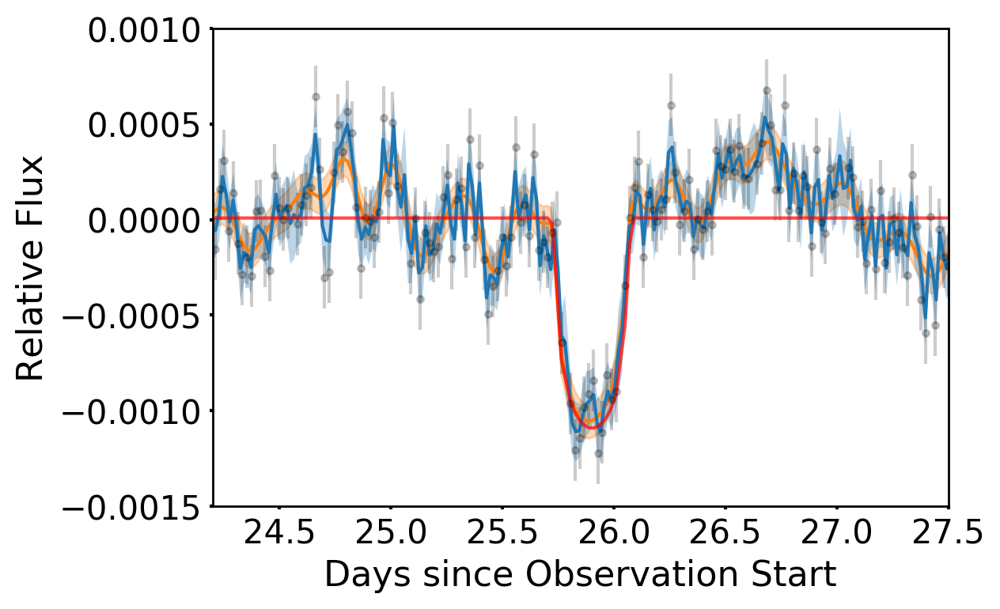

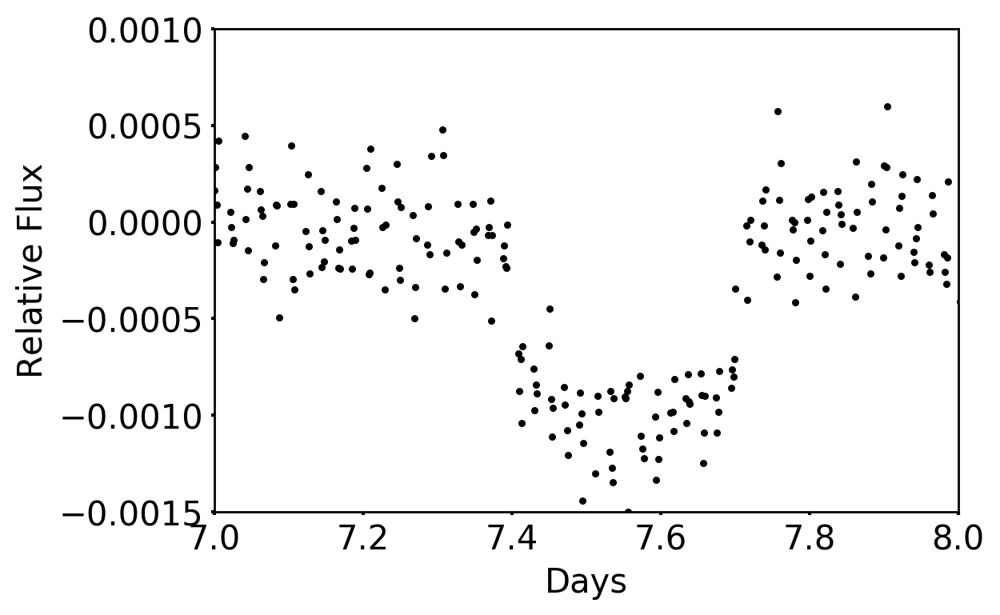

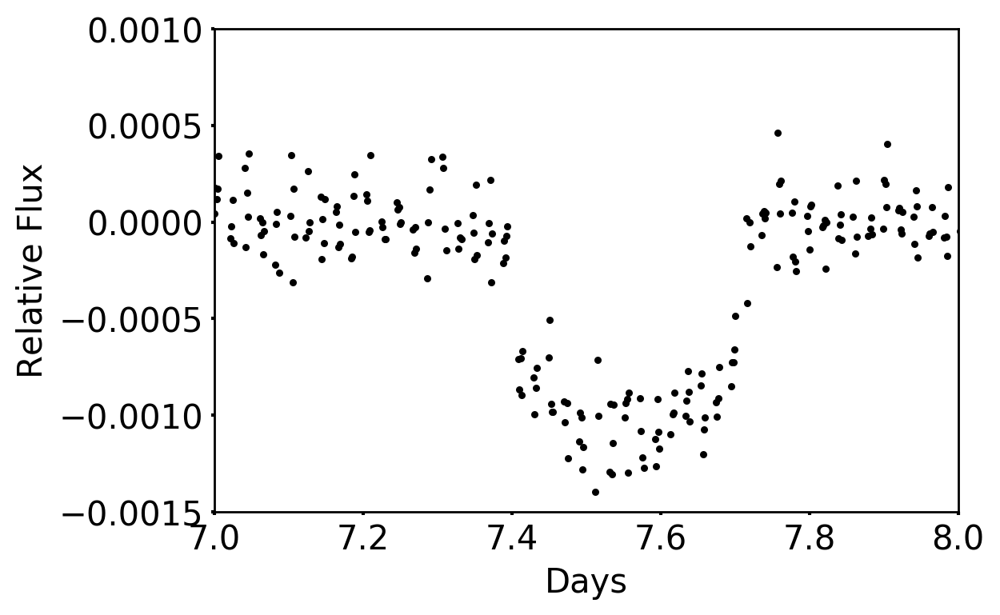

(-0.0015, 0.001)

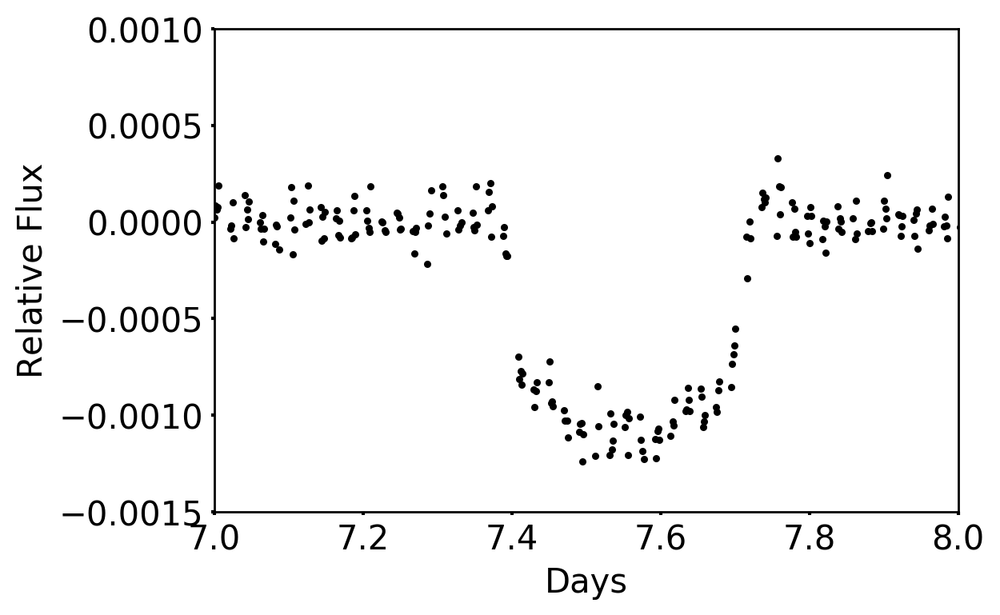

In [165]:
#combo SEGP and SHOGP plot


fluxtransitsub = y - fitT.transitmodel
#plt.scatter(timesarraymod, fluxtransitsub)
#plt.show()


#prepare covariance matrix K
X = scipy.matrix([t]).T #x coords of input values
xpred = np.r_[0:80:5000j]
Xpred = scipy.matrix([xpred]).T # x coords of output (prediction)
#for now, make Xpred equal to X
#Xpred = X
dist = scipy.spatial.distance.cdist(X, X, 'sqeuclidean')
distpred = scipy.spatial.distance.cdist(Xpred, X, 'sqeuclidean')
distss = scipy.spatial.distance.cdist(Xpred, Xpred, 'sqeuclidean')

#h = 193*1e-6
h = 500*1e-6
lambd = 0.091
#lambd=0.001
#sigma = 178*1e-6
sigma = 200*1e-6

K = scipy.matrix(h**2 * scipy.exp(-dist/(2*lambd**2)) + sigma**2 *scipy.identity(X.shape[0]))
Ks = scipy.matrix(h**2 * scipy.exp(-distpred/(2*lambd**2)))# + [sigma**2 *scipy.identity(X.shape[0])[i] for i in range(X.shape[0])])
Kss = scipy.matrix(h**2 * scipy.exp(-distss/(2*lambd**2))) #+ [sigma**2 *scipy.identity(Xpred.shape[0])[i] for i in range(Xpred.shape[0])])


L = scipy.linalg.cho_factor(K)
b = scipy.linalg.cho_solve(L, scipy.matrix([fluxtransitsub]).T) #input arrays must be a certain shape: all columns, 1 row
print( 'Ks.Shape', Ks.shape, "b.shape", scipy.matrix(b).shape)
GP_meanfunc = np.array(Ks*scipy.matrix(b)).flatten()
b = scipy.linalg.cho_solve(L, Ks.T)
GP_cov = scipy.array(scipy.sqrt(np.diag(Kss - Ks * scipy.matrix(b)))).flatten()

#plt.plot(np.ravel(Xpred), GP_meanfunc, 'g')
color = "#ff7f0e"
plt.errorbar(t, y, yerr=yerr, capsize=0, fmt='.k', alpha=0.2)
plt.plot(np.ravel(Xpred), GP_meanfunc+np.interp(np.ravel(Xpred), t, fitT.transitmodel), color=color)
#plt.fill_between(np.ravel(Xpred), \
#                 GP_meanfunc+np.interp(np.ravel(Xpred), timesarray, fitT.transitmodel)+2*GP_cov, \
#                 GP_meanfunc+np.interp(np.ravel(Xpred), timesarray, fitT.transitmodel)-2*GP_cov, alpha=0.1, color=color)
plt.fill_between(np.ravel(Xpred), \
                 GP_meanfunc+np.interp(np.ravel(Xpred), t, fitT.transitmodel)+GP_cov, \
                 GP_meanfunc+np.interp(np.ravel(Xpred), t, fitT.transitmodel)-GP_cov, alpha=0.3, color=color)
plt.plot(x, pred_mean)#, color='green')
plt.fill_between(x, (pred_mean+pred_std), (pred_mean-pred_std), alpha=0.3,
                 edgecolor="none")

plt.plot(t, fitT.transitmodel, alpha=0.7, color='r')


plt.xlim(24.2,27.5)
#plt.xlim(45,48)
plt.ylim(-0.0015,0.001)
plt.xlabel('Days since Observation Start', fontsize=16)
plt.ylabel('Relative Flux', fontsize=16)
plt.show()

tmod = t % 9.1751
plt.clf()
#plt.subplots_adjust(left=0.16, bottom=0.09, right=0.94, top=0.96, wspace=0.2, \
#        hspace=0.25)
#plt.subplot(3,1,1)
plt.scatter(tmod, y, s=5, c='k')
plt.plot(tmod[:200], fitT.transitmodel[:200], lw=3)
#plt.title('Phase-Folded Data and Model')
plt.xlabel('Days')
plt.ylabel('Relative Flux')
plt.xlim(7,8)
plt.ylim(-0.0015,0.0010)
#plt.subplot(3,1,2)
#ax.set_aspect(0.3)
#plt.figure(figsize=(6,3))
plt.show()
plt.clf()
plt.scatter(tmod, y-np.interp(t, np.ravel(Xpred),GP_meanfunc), s=5, c='k')
plt.plot(tmod[:200], fitT.transitmodel[:200], lw=3)
#plt.title('Phase-Folded Data and Model with SEGP model subtracted')
plt.xlabel('Days')
plt.ylabel('Relative Flux')
plt.xlim(7,8)
plt.ylim(-0.0015,0.0010)
#plt.subplot(3,1,3)
#ax.set_aspect(0.3)
#plt.figure(figsize=(6,3))
plt.show()
plt.clf()
plt.scatter(tmod, y-(np.interp(t, x, pred_mean)-fitT.transitmodel), s=5, c='k')
plt.plot(tmod[:200], fitT.transitmodel[:200], lw=3)
#plt.title('Phase-Folded Data and Model with SHOGP model subtracted')
plt.xlabel('Days')
plt.ylabel('Relative Flux')
plt.xlim(7,8)
plt.ylim(-0.0015,0.0010)
#plt.tight_layout()

In [173]:
rhotrue= 0.0264
rhosigma = 0.0008
#rhosigma = 0.001
# pertrue = 8.405
# persigma = 0.3
# impacttrue = 0.94
# impactsigma = 0.05
# T0true= 2.4
# LD1true = 0.6505
# LD2true = 0.1041
# LDsigma = 0.1


# #M = ktransit.LCModel()

# def lnprior(theta):
#     lncov_amp, lncov_length, lnsigma, rprs, lnper, impact, T0, rho = theta
#     #lncov_amp, lncov_length, lnsigma, rprs, lnper, impact, T0, rho, LD1, LD2 = theta
#     if -12.0 < lncov_amp < 0.0 and -10.0 < lncov_length < 10.0 and -20.0 < lnsigma < 0.0 and 0.0 < rprs < 0.5 \
#       and np.log(8.35) < lnper < np.log(8.45) and 0.0 < impact < 1.0 + rprs and 1.3 < T0 < 2.5:# and 0.0 < LD1 < 1.0 \
#       #and 0.0 < LD2 < 1.0:
#         return 0.0 - (((rhotrue - rho)/rhosigma)**2/2.)# - (((LD1true - LD1)/LDsigma)**2/2.) - (((LD2true - LD2)/LDsigma)**2/2.) #- (((impacttrue - impact)/impactsigma)**2/2.) #- (((pertrue - per)/persigma)**2/2.) 
#     return -np.inf

def lnprob(params, y, gp):
    gp.set_parameter_vector(params)
    #print(((rhotrue - np.e**params[-3])/rhosigma)**2/2.)
    lp = gp.log_prior()
    if not np.isfinite(lp):
        return -np.inf
    
    ll = gp.log_likelihood(y)
    
    if not np.isfinite(ll):
        return -np.inf
    #print(params[9])
    return ll + lp - (((rhotrue - (np.e**params[9]))/rhosigma)**2/2.) #+ np.log(1./np.sqrt(params[-2]**2 + params[-1]**2))
    
        
# Set up the sampler.
import emcee
#import triangleedit
import time

merged_par = gp.get_parameter_vector()

from matplotlib.ticker import MaxNLocator
ndim, nwalkers = len(merged_par), 30
pos = [merged_par *(1+ 5e-4*np.random.randn(ndim)) for i in range(nwalkers)]
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(y,gp), threads=8) 
    
# Time an MCMC step, and estimate length of time to run chain.
t0 = time.time()
sampler.run_mcmc(pos, 1, rstate0=np.random.get_state())
tstep = time.time()-t0
Nsteps = 50000
from time import localtime, strftime
tstart = strftime("%a, %d %b %Y %H:%M:%S", localtime())
print("""MCMC step runtime (in seconds): {0}
        MCMC estimated total runtime (in seconds): {1}
        Start time: {2}
        """.format(tstep, tstep * Nsteps, tstart))

# Clear and run the production chain.
print("Running MCMC...")
sampler.run_mcmc(pos, Nsteps, rstate0=np.random.get_state())
print("Done.")
print("End time:", strftime("%a, %d %b %Y %H:%M:%S", localtime()))

burnin = 5000
samples = sampler.chain[:, burnin:, :].reshape((-1, ndim))

# #save all chains as txt file
# np.savetxt('allchains.txt', samples)

# #make and save planetmass chains as txt file
# f = open('epic2113_stellarsamples.txt')
# e = f.read()

# g = e.split('\n')

# h = []
# for i in range(len(g)):
#     h.append(g[i].split())
# hh = np.asarray(h[1:-1])
# starrad = np.array([float(i) for i in hh[:,1]])

# print("Autocorrelation time:", sampler.acor)

MCMC step runtime (in seconds): 0.5334820747375488
        MCMC estimated total runtime (in seconds): 26674.10373687744
        Start time: Fri, 15 Sep 2017 10:08:27
        
Running MCMC...
Done.
End time: Fri, 15 Sep 2017 12:05:54


Gelman-Rubin Statistic:
    S0 = 1.0021088747340425
    omega0 = 1.0015546077342683
    S1 = 1.00149617963373
    omega1 = 1.002080808482967
    S2 = 1.0038342691116535
    q2 = 1.003229169592976
    numax = 1.0033195435913447
    sigma = 1.0055989545906963
    rp/rs = 1.0019564653081527
    rho = 1.0024283079065375
    T0 = 1.001543419189363
    b = 1.001907184977601



/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:703: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


50001 17161.8576047
49901
[ 17094.03691674  17094.03691674  17096.73969577 ...,  17162.20934275
  17161.98130138  17161.5652128 ]


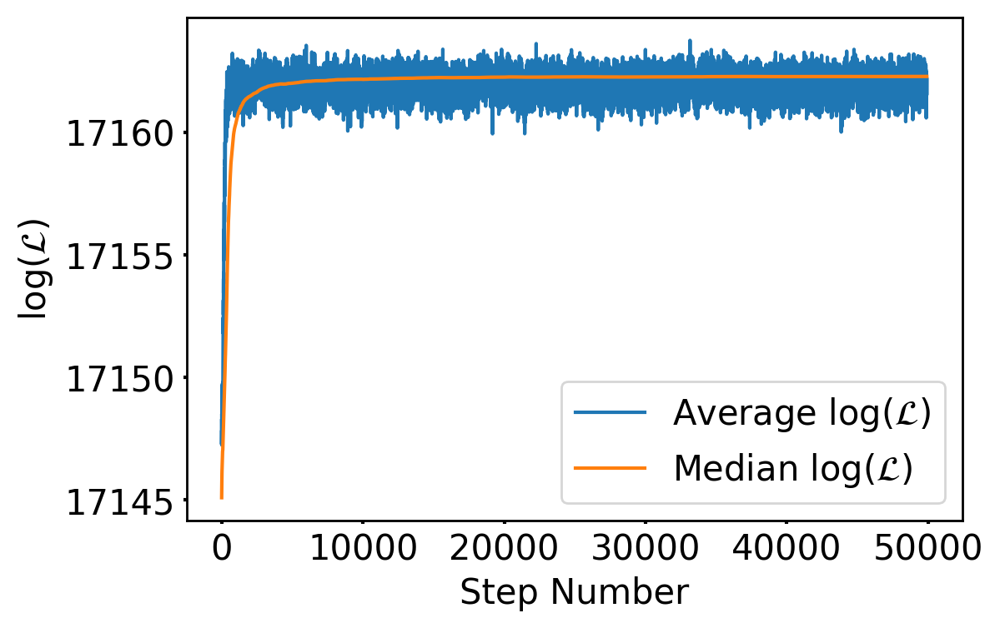

In [178]:
# Evaluate Gelman-Rubin statistic for a parameter of index j
def zj(j): # average parameter value for all chains
    return 1. / len(sampler.flatchain[:,j]) * np.sum(sampler.flatchain[:,j])
def zjk(j, k): # average parameter value along kth chain
    return 1. / len(sampler.chain[k,:,j]) * np.sum(sampler.chain[k,:,j])
def chainvar(j, k): # variance within a chain
    return 1. / len(sampler.chain[k,:,j]) * np.sum((sampler.chain[k,:,j] - zjk(j,k))**2)
def wj(j):
    a = 0
    for k in range(len(sampler.chain[:,0,j])):
        a += 1. / len(sampler.chain[:,0,j]) * np.sum(chainvar(j,k))
    return a
def Bj(j):
    a = 0
    for k in range(len(sampler.chain[:,0,0])):
        a += len(sampler.chain[0,:,j]) / (len(sampler.chain[:,0,j]) - 1.) * np.sum((zjk(j,k) - zj(j))**2)
    return a           
def GR(j):
    return np.sqrt((len(sampler.chain[0,:,j]) - 1.) / len(sampler.chain[0,:,j]) + Bj(j) / (wj(j) * len(sampler.chain[0,:,j])))
print("""Gelman-Rubin Statistic:
    S0 = {0}
    omega0 = {1}
    S1 = {2}
    omega1 = {3}
    S2 = {4}
    q2 = {5}
    numax = {6}
    sigma = {7}
    rp/rs = {8}
    rho = {9}
    T0 = {10}
    b = {11}
""".format(GR(0), GR(1), GR(2), GR(3), GR(4), GR(5), GR(6), GR(7), GR(8), GR(9), GR(10), GR(11)))#, GR(12)))#, GR(12), GR(13)))

# Plot mean lnlikelihood of all walkers at a given step along with median lnlikelihood for all walkers up to 
# that point to determine appropriate burn-in length.
meanlnprob = np.zeros(len(sampler.lnprobability[0,:]))
medlnprob = np.zeros(len(sampler.lnprobability[0,:]))
for i in range(len(sampler.lnprobability[0,:])):
    meanlnprob[i] = np.nanmean(sampler.lnprobability[:,i])
    medlnprob[i] = np.nanmedian(sampler.lnprobability[:, :i])

print(len(meanlnprob),np.nanmean(meanlnprob))
print(len(np.r_[0:49901:49901j]))
print(meanlnprob)
plt.clf()
plt.plot(np.r_[0:49901:49901j], meanlnprob[100:], label=r"Average log($\mathcal{L}$)")
plt.plot(np.r_[0:49901:49901j], medlnprob[100:], label=r"Median log($\mathcal{L}$)")
plt.legend(loc=4)
plt.xlabel("Step Number")
plt.ylabel("log($\mathcal{L}$)")
#plt.ylim(-0.0001,0.0001)
#plt.savefig("medmeanQP.png")
plt.show()

In [134]:
%%timeit
gp.compute(t, yerr)
gp.apply_inverse(y)

/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/celerite/celerite.py:339: RuntimeWarning: overflow encountered in exp
  .get_value(self._t))


100 loops, best of 3: 12.6 ms per loop


MCMC result:
lns00 = -19.55618465461904 +0.27122605784754583 -0.26508152367532034 
lnomega00 = 1.3664917170674986 +0.16229352699367694 -0.14638314981704648
lns01 = -21.080578347044963 +0.1372195706309043 -0.13441769317018526 
lnq1 = 3.4703360317608274 +0.07834341749670637 -0.07724256478780145
lns02 = -28.23374303631222 +0.5036476288079292 -0.6465611605242465 
lnq2 = 3.2249493724221927 +0.4619336797494964 -0.3662995712726076
log(muhztoomega(numax)) = 4.877334672649529 +0.011650452071166661 -0.008162472739794424
lnsigma = -15.485911010220768 +3.053387800876923 -3.088748427497457 
lnrprs = -3.3537009739753203 +0.025078954932382214 -0.026532343087947385
lnrho = -3.6318241970056055 +0.02933773063730616 -0.03032727041362282
lnT0 = 2.021641039155344 +0.00036204414765261816 -0.00036094011615617205
lnimp = -0.1597413595872161 +0.007502138760467708 -0.007884066057040756

Mean acceptance fraction: 0.351
rprs: 0.0349547478021  + 0.000887713480902  - 0.0708493399678
numax: 241.827632363  + 1.863657

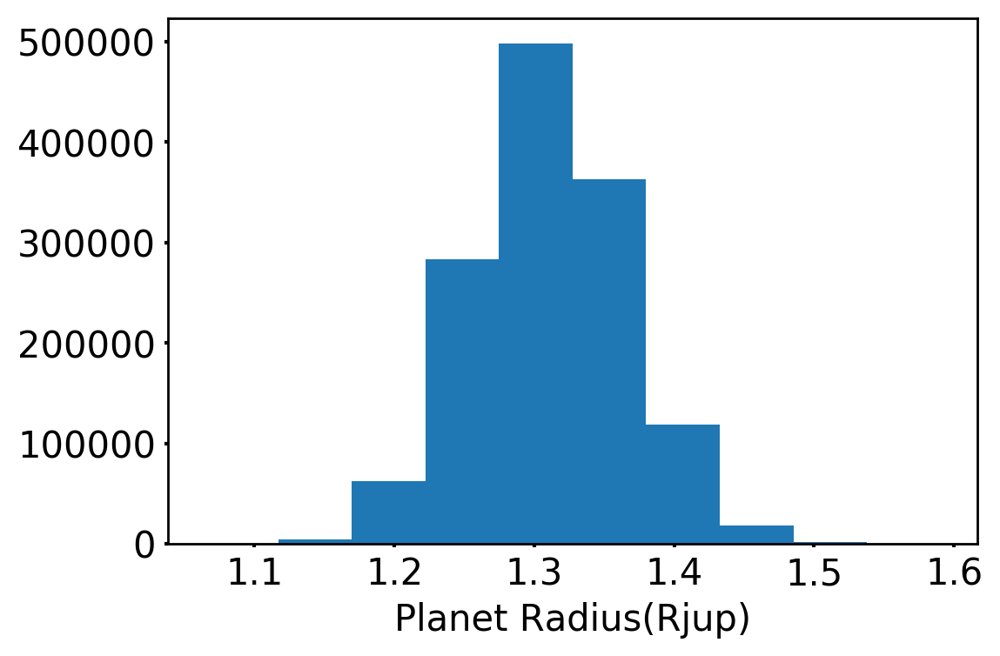

Teff:  4840.15303421  +  83.9928344349  -  87.5863798339
FeH:  -0.00997199920529  +  0.0734687774897  -  0.0769122597808
Mstar:  1.07784047753  +  0.0827975142371  -  0.0797511517076
Rstar:  3.85497224529  +  0.127215085252  -  0.127193110975
rhostar:  0.0265275778253  +  0.000750514563369  -  0.000771249575304
logg:  3.29861506264  +  0.00690568283223  -  0.0072784710333
Rp:  1.30940882016  +  0.0552693853164  -  0.0556322976871


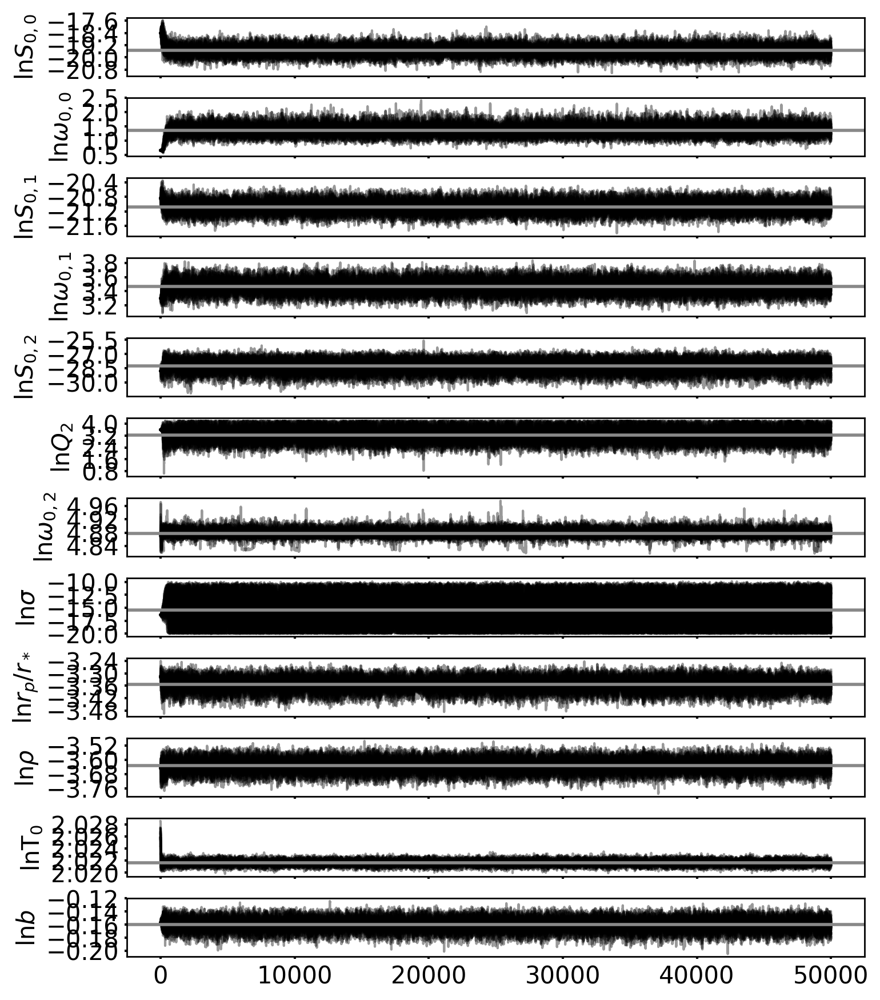

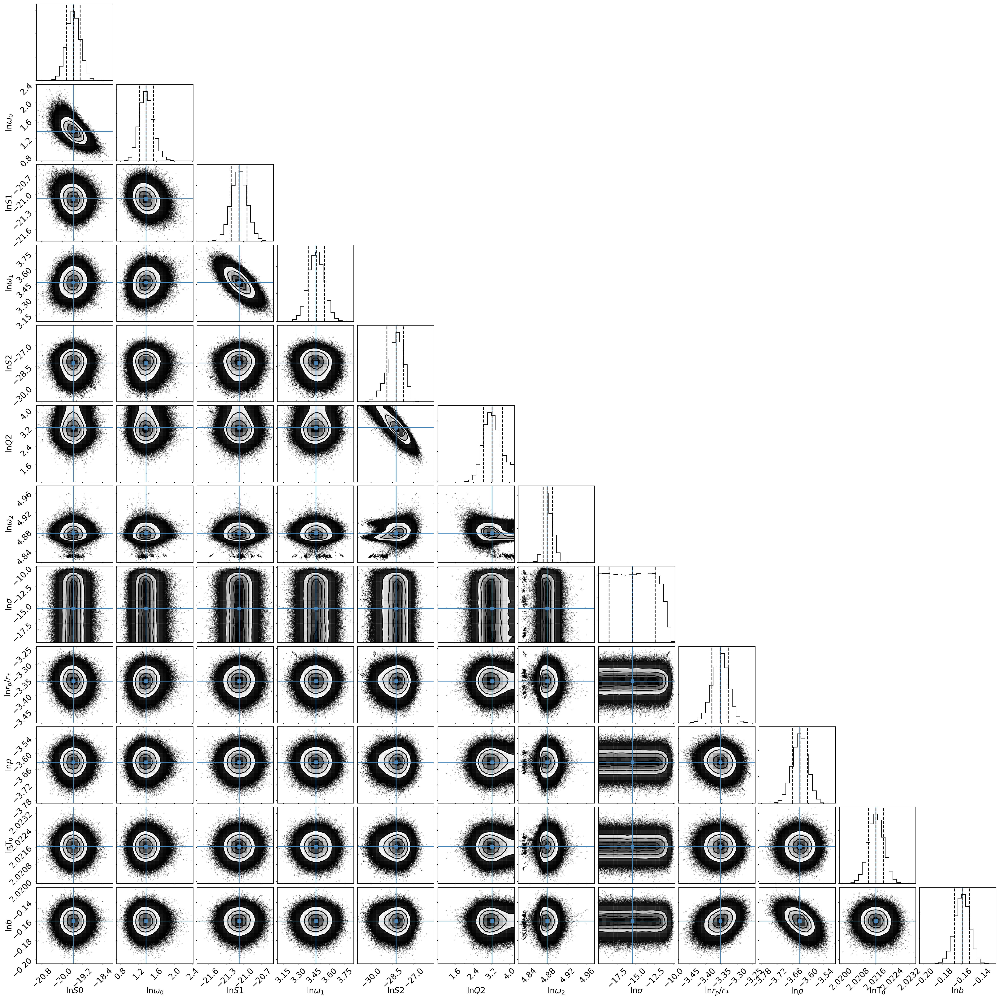

In [177]:
lnrprssamples = sampler.chain[:, burnin:, 8].flatten()


[log_s00_mcmc, log_omega00_mcmc, log_s01_mcmc, log_omega01_mcmc, log_s02_mcmc, \
    log_q2_mcmc, log_omega02_mcmc, log_sigma_mcmc, log_rprs_mcmc, log_rho_mcmc, \
 log_T0_mcmc, log_imp_mcmc] = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                            zip(*np.percentile(samples, [16, 50, 84], axis=0))) 
print("""MCMC result:
lns00 = {0[0]} +{0[1]} -{0[2]} 
lnomega00 = {1[0]} +{1[1]} -{1[2]}
lns01 = {2[0]} +{2[1]} -{2[2]} 
lnq1 = {3[0]} +{3[1]} -{3[2]}
lns02 = {4[0]} +{4[1]} -{4[2]} 
lnq2 = {5[0]} +{5[1]} -{5[2]}
log(muhztoomega(numax)) = {6[0]} +{6[1]} -{6[2]}
lnsigma = {7[0]} +{7[1]} -{7[2]} 
lnrprs = {8[0]} +{8[1]} -{8[2]}
lnrho = {9[0]} +{9[1]} -{9[2]}
lnT0 = {10[0]} +{10[1]} -{10[2]}
lnimp = {11[0]} +{11[1]} -{11[2]}
""".format(log_s00_mcmc, log_omega00_mcmc, log_s01_mcmc, log_omega01_mcmc, log_s02_mcmc, \
    log_q2_mcmc, log_omega02_mcmc, log_sigma_mcmc, log_rprs_mcmc, log_rho_mcmc, log_T0_mcmc, \
    log_imp_mcmc)) 
#lnper = {8[0]} +{8[1]} -{8[2]} 
#ecosw = {12[0]} +{12[1]} -{12[2]}
#esinw = {13[0]} +{13[1]} -{13[2]}

print("Mean acceptance fraction: {0:.3f}"
        .format(np.mean(sampler.acceptance_fraction)))

print('rprs:',np.exp(log_rprs_mcmc[0]),' +', np.exp(log_rprs_mcmc[0]+log_rprs_mcmc[1])-np.exp(log_rprs_mcmc[0]), \
      ' -', np.exp(log_rprs_mcmc[0]+log_rprs_mcmc[2])+np.exp(log_rprs_mcmc[0]))

print('numax:',omega2muhz(np.exp(log_omega02_mcmc[0])),' +', omega2muhz(np.exp(log_omega02_mcmc[1])), ' -', omega2muhz(np.exp(log_omega02_mcmc[2])))


# use Teff from specmatch, numax and dnu MCMC dists to calculate stellar log g, density, mass, and radius

#2287
Teff = np.sqrt(60**2+59**2)*np.random.randn(len(lnrprssamples)) + 4840. #add errors of Torres et al in quadrature
FeH = np.sqrt(0.04**2+0.062**2)*np.random.randn(len(lnrprssamples)) - 0.01
numax = 3.3*np.random.randn(len(lnrprssamples)) + 245.65 #inflate errors?
dnu = 0.26*np.random.randn(len(lnrprssamples)) + 18.48
fdnu = 0.998

#K2-97
#Teff = 90*np.random.randn(len(lnrprssamples)) + 4790. #add errors of Torres et al in quadrature
#FeH = 0.08*np.random.randn(len(lnrprssamples)) +0.42
#numax = 5.4*np.random.randn(len(lnrprssamples)) + 223.7 #inflate errors?
#dnu = 0.17*np.random.randn(len(lnrprssamples)) + 16.83
#fdnu = 0.994

#2011
#Teff = 60*np.random.randn(len(lnrprssamples)) + 4800. #add errors of Torres et al in quadrature
#FeH = 0.04*np.random.randn(len(lnrprssamples)) - 0.29
#numax = 3.3*np.random.randn(len(lnrprssamples)) + 47.65 #inflate errors?
#dnu = 0.26*np.random.randn(len(lnrprssamples)) + 5.34
#fdnu = 0.98#?

Teffsun = 5777
numaxsun = 3100
dnusun = 135


Mstar = np.zeros_like(Teff)
Rstar = np.zeros_like(Teff)
rhostar = np.zeros_like(Teff)
logg = np.zeros_like(Teff)
Rp = np.zeros_like(lnrprssamples)

for i in range (len(Teff)):
    Mstar[i] = (numax[i] / numaxsun)**3 * (dnu[i] / (fdnu*dnusun))**(-4) * (Teff[i] / Teffsun)**(3/2)
    Rstar[i] = (numax[i] / numaxsun) * (dnu[i] / (fdnu*dnusun))**(-2) * (Teff[i] / Teffsun)**(1/2)
    rhostar[i] = 1.41 * (Mstar[i] / Rstar[i]**3)
    logg[i] = 4.43812 + np.log10(Mstar[i] / Rstar[i]**2)


    
#then use this to calculate planet radius with errors
for i in range(len(lnrprssamples)):
    Rp[i] = np.exp(lnrprssamples[i]) * Rstar[i] * 6.95e5 / 71492
plt.hist(Rp)
plt.xlabel('Planet Radius(Rjup)')
plt.show()

print('Teff: ', np.percentile(Teff, 50), ' + ', np.percentile(Teff, 84.1)- np.percentile(Teff,50), ' - ', np.percentile(Teff,50) - np.percentile(Teff,14.9))
print('FeH: ', np.percentile(FeH, 50), ' + ', np.percentile(FeH, 84.1)- np.percentile(FeH,50), ' - ', np.percentile(FeH,50) - np.percentile(FeH,14.9))
print('Mstar: ', np.percentile(Mstar, 50), ' + ', np.percentile(Mstar, 84.1)- np.percentile(Mstar,50), ' - ', np.percentile(Mstar,50) - np.percentile(Mstar,14.9))
print('Rstar: ', np.percentile(Rstar, 50), ' + ', np.percentile(Rstar, 84.1)- np.percentile(Rstar,50), ' - ', np.percentile(Rstar,50) - np.percentile(Rstar,14.9))
print('rhostar: ', np.percentile(rhostar, 50), ' + ', np.percentile(rhostar, 84.1)- np.percentile(rhostar,50), ' - ', np.percentile(rhostar,50) - np.percentile(rhostar,14.9))
print('logg: ', np.percentile(logg, 50), ' + ', np.percentile(logg, 84.1)- np.percentile(logg,50), ' - ', np.percentile(logg,50) - np.percentile(logg,14.9))

print('Rp: ', np.percentile(Rp, 50), ' + ', np.percentile(Rp, 84.1)- np.percentile(Rp,50), ' - ', np.percentile(Rp,50) - np.percentile(Rp,14.9))
np.savetxt('2287stellarrads.txt', Rstar)
np.savetxt('2287stellarmass.txt', Mstar)
np.savetxt('2287planetrads.txt', Rp)
np.savetxt('2287rprssamples.txt', [np.exp(lnrprssamples[i]) for i in range(len(lnrprssamples))])

plt.clf()
fig, axes = plt.subplots(len(merged_par), 1, sharex=True, figsize=(8, 9))
axes[0].plot((sampler.chain[:, :, 0].T), color="k", alpha=0.4)
axes[0].yaxis.set_major_locator(MaxNLocator(5))
axes[0].axhline(np.median(sampler.chain[:, :, 0].T), color="#888888", lw=2)
axes[0].set_ylabel(r"ln$S_{0,0}$")
    
axes[1].plot((sampler.chain[:, :, 1].T), color="k", alpha=0.4)
axes[1].yaxis.set_major_locator(MaxNLocator(5))
axes[1].axhline(np.median(sampler.chain[:, :, 1].T), color="#888888", lw=2)
axes[1].set_ylabel(r"ln$\omega_{0,0}$")

axes[2].plot((sampler.chain[:, :, 2].T), color="k", alpha=0.4)
axes[2].yaxis.set_major_locator(MaxNLocator(5))
axes[2].axhline(np.median(sampler.chain[:, :, 2].T), color="#888888", lw=2)
axes[2].set_ylabel(r"ln$S_{0,1}$")
    
axes[3].plot((sampler.chain[:, :, 3].T), color="k", alpha=0.4)
axes[3].yaxis.set_major_locator(MaxNLocator(5))
axes[3].axhline(np.median(sampler.chain[:, :, 3].T), color="#888888", lw=2)
axes[3].set_ylabel(r"ln$\omega_{0,1}$")

axes[4].plot((sampler.chain[:, :, 4].T), color="k", alpha=0.4)
axes[4].yaxis.set_major_locator(MaxNLocator(5))
axes[4].axhline(np.median(sampler.chain[:, :, 4].T), color="#888888", lw=2)
axes[4].set_ylabel(r"ln$S_{0,2}$")

axes[5].plot((sampler.chain[:, :, 5].T), color="k", alpha=0.4)
axes[5].yaxis.set_major_locator(MaxNLocator(5))
axes[5].axhline(np.median(sampler.chain[:, :, 5].T), color="#888888", lw=2)
axes[5].set_ylabel(r"ln$Q_2$")

axes[6].plot((sampler.chain[:, :, 6].T), color="k", alpha=0.4)
axes[6].yaxis.set_major_locator(MaxNLocator(5))
axes[6].axhline(np.median(sampler.chain[:, :, 6].T), color="#888888", lw=2)
axes[6].set_ylabel(r"ln$\omega_{0,2}$")

axes[7].plot((sampler.chain[:, :, 7].T), color="k", alpha=0.4)
axes[7].yaxis.set_major_locator(MaxNLocator(5))
axes[7].axhline(np.median(sampler.chain[:, :, 7].T), color="#888888", lw=2)
axes[7].set_ylabel(r"ln$\sigma$")

axes[8].plot((sampler.chain[:, :, 8].T), color="k", alpha=0.4)
axes[8].yaxis.set_major_locator(MaxNLocator(5))
axes[8].axhline(np.median(sampler.chain[:, :, 8].T), color="#888888", lw=2)
axes[8].set_ylabel(r"ln$r_p/r_*$")

axes[9].plot((sampler.chain[:, :, 9].T), color="k", alpha=0.4)
axes[9].yaxis.set_major_locator(MaxNLocator(5))
axes[9].axhline(np.median(sampler.chain[:, :, 9].T), color="#888888", lw=2)
axes[9].set_ylabel(r"ln$\rho$")

axes[10].plot((sampler.chain[:, :, 10].T), color="k", alpha=0.4)
axes[10].yaxis.set_major_locator(MaxNLocator(5))
axes[10].axhline(np.median(sampler.chain[:, :, 10].T), color="#888888", lw=2)
axes[10].set_ylabel(r"lnT$_0$")

axes[11].plot((sampler.chain[:, :, 11].T), color="k", alpha=0.4)
axes[11].yaxis.set_major_locator(MaxNLocator(5))
axes[11].axhline(np.median(sampler.chain[:, :, 11].T), color="#888888", lw=2)
axes[11].set_ylabel(r"ln$b$")

# axes[12].plot((sampler.chain[:, :, 12].T), color="k", alpha=0.4)
# axes[12].yaxis.set_major_locator(MaxNLocator(5))
# axes[12].axhline(np.median(sampler.chain[:, :, 12].T), color="#888888", lw=2)
# axes[12].set_ylabel(r"ln$b$")

# axes[13].plot((sampler.chain[:, :, 13].T), color="k", alpha=0.4)
# axes[13].yaxis.set_major_locator(MaxNLocator(5))
# axes[13].axhline(np.median(sampler.chain[:, :, 13].T), color="#888888", lw=2)
# axes[13].set_ylabel(r"$e$sin$\omega$")

# axes[8].plot((sampler.chain[:, :, 8].T), color="k", alpha=0.4)
# axes[8].yaxis.set_major_locator(MaxNLocator(5))
# axes[8].axhline(np.median(sampler.chain[:, :, 8].T), color="#888888", lw=2)
# axes[8].set_ylabel(r"ln$r_p/r_*$")


    
fig.tight_layout(h_pad=0.0)
#fig.savefig("/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC201132839/intransitchainSHO.png")
fig.savefig("/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC228754001/intransitchainSHO.png")
    
import corner
from matplotlib.ticker import MultipleLocator, FormatStrFormatter


majorFormatter = FormatStrFormatter('%.2f')
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(majorFormatter)

plt.clf()
#plt.rcParams["font.size"] = 12
#plt.rcParams["font.family"] = "sans-serif"
#plt.rcParams["font.sans-serif"] = ["Computer Modern Sans"]
#plt.rcParams["text.usetex"] = True
#plt. rcParams["text.latex.preamble"] = r"\usepackage{cmbright}"

plt.rcParams['font.size']=15
plt.rcParams['savefig.dpi']=200
#, r"$e$cos$\omega$", r"$e$sin$\omega$"
fig = corner.corner(samples, labels=[r"ln$S0$", r"ln$\omega_0$", r"ln$S1$", r"ln$\omega_1$", r"ln$S2$", r"ln$Q2$", r"ln$\omega_2$",\
                                     r"ln$\sigma$", r"ln$r_p/r_*$",r"ln$\rho$", r"lnT$_0$", r"ln$b$"], quantiles=[0.16, 0.5, 0.84],
                      truths=[np.median(sampler.chain[:, :, 0].T), np.median(sampler.chain[:, :, 1].T), np.median(sampler.chain[:, :, 2].T), \
                              np.median(sampler.chain[:, :, 3].T), np.median(sampler.chain[:, :, 4].T), np.median(sampler.chain[:, :, 5].T), \
                              np.median(sampler.chain[:, :, 6].T), np.median(sampler.chain[:, :, 7].T), np.median(sampler.chain[:, :, 8].T), \
                              np.median(sampler.chain[:, :, 9].T), np.median(sampler.chain[:, :, 10].T), np.median(sampler.chain[:, :, 11].T)], rasterized=True)#, \
                              #np.median(sampler.chain[:, :, 12].T)])#, np.median(sampler.chain[:, :, 13].T)])
    
#fig.tight_layout()                            
#fig.savefig("/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC201132839/2011triangleSHO.png")
fig.savefig("/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC228754001/triangleSHO.png")

# #plt.show()


#calculate G-R statistic to confirm chain convergence


In [58]:
#muhz2omega(220)

omega2muhz(np.exp(3.4))

55.19600275281632

In [176]:
#burnin = 200
#samples = sampler.chain[:, burnin:, :].reshape((-1, ndim))
psds = np.empty((len(samples),len(omega)))
white_noise = (yerr**2 + gp.kernel.jitter) / len(t)
print(white_noise)
for i, params in enumerate(samples):
    gp.set_parameter_vector(params)
    psds[i] = (gp.kernel.get_psd(omega) + white_noise) / (2. * np.pi)
    

1.08661355483e-11


ERROR: KeyboardInterrupt [numpy.core.shape_base]
ERROR:astropy:KeyboardInterrupt


KeyboardInterrupt: 

In [133]:
percentiles = np.percentile(psds, [16,50,84], axis=0)

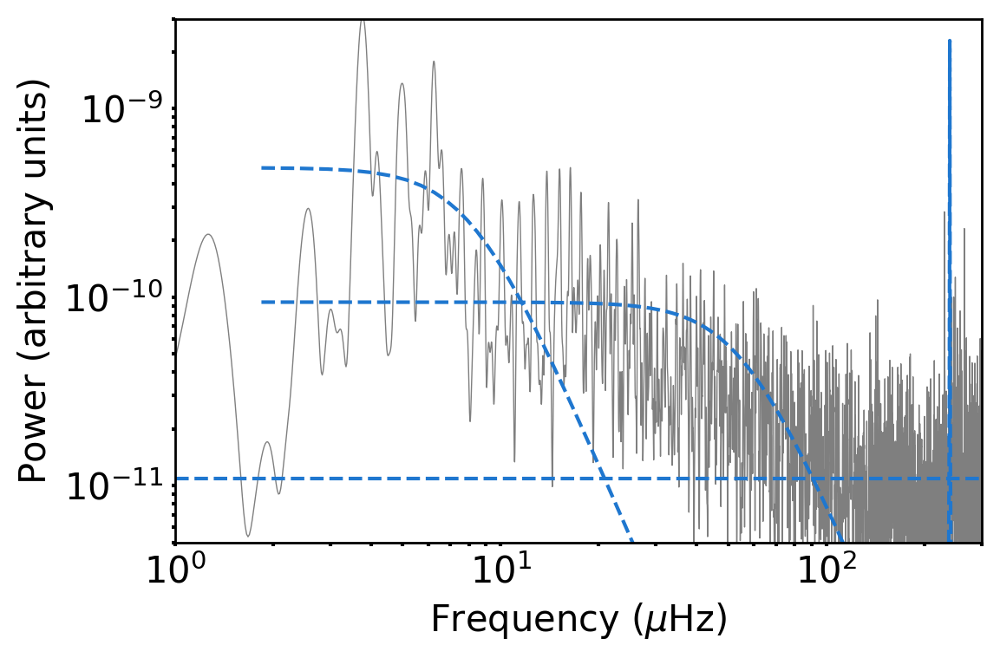

In [134]:


#plt.plot(freqmuhz,power_ls)
plt.plot(freq,fts/(2*np.pi), lw=0.5, color='k', alpha=0.5)
plt.plot(freqmuhz, percentiles[1]+white_noise)
plt.fill_between(freqmuhz, percentiles[0]+white_noise, percentiles[2]+white_noise, alpha=0.5)

#diff components of model
#plt.plot(freqmuhz, psd/(2.*np.pi) + yerr**2/len(t)) #PS + WN 
for k in gp.kernel.terms:
    plt.plot(freqmuhz, k.get_psd(omega)/(2.*np.pi), "--", color='#1f77cf')


plt.axhline(yerr**2/len(t), ls='--', color='#1f77cf') #WN level
plt.yscale("log")
plt.ylim(5e-12,3e-9)
plt.xscale("log")
plt.xlim(omega[0], omega[-1])
plt.xlabel(r"Frequency ($\mu$Hz)")
plt.ylabel(r"Power (arbitrary units)");

In [143]:
ysim = gp.sample(t,tiny=yerr**2)

ERROR: TypeError: sample() got an unexpected keyword argument 'tiny' [IPython.core.interactiveshell]


TypeError: sample() got an unexpected keyword argument 'tiny'

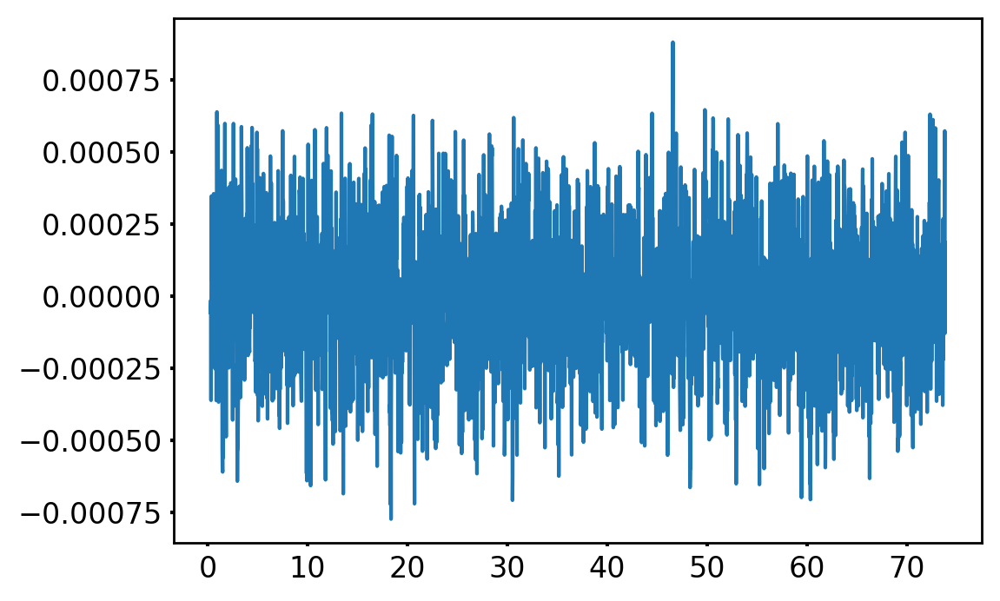

In [307]:
plt.plot(t,ysim)

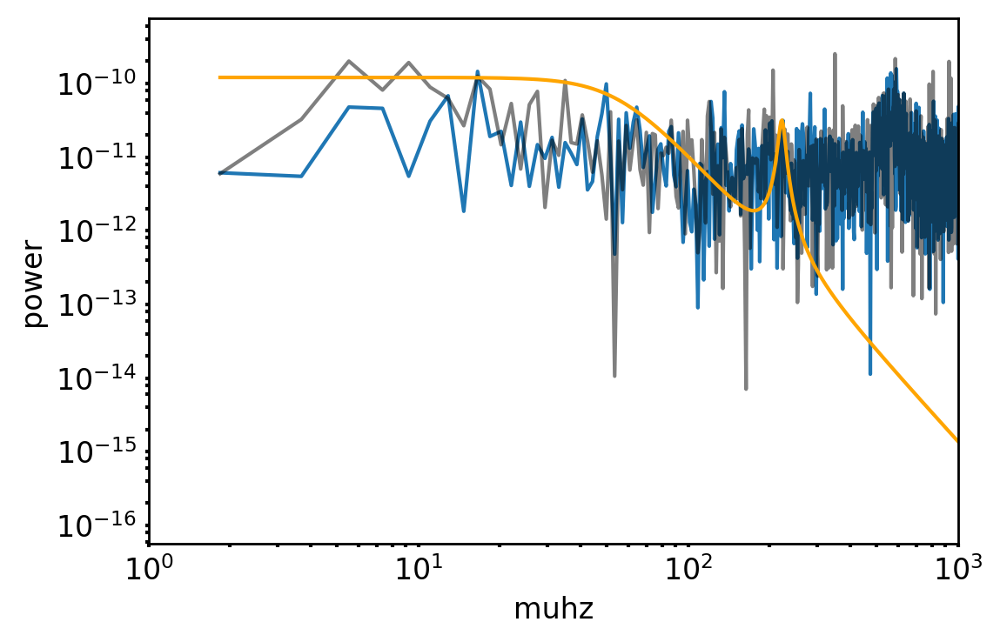

In [308]:
model = LombScargle(t, ysim)
power_simls = model.power(freqidays, method="fast", normalization="psd")
power_simls /= len(t)

plt.plot(freqmuhz, power_simls)
plt.plot(freqmuhz,power_ls,alpha=0.5, color='k')
plt.plot(freqmuhz, psd /(2*np.pi), color="orange")
plt.yscale("log")
plt.xscale("log")
plt.xlim(omega[0], omega[-1])
plt.xlabel("muhz")
plt.ylabel("power");

start lengths: 2512 2512
1.2511999999999999
new lens: 2484 2484
1.2484
new lens: 2476 2476
1.2476
new lens: 2474 2474
1.2474
new lens: 2473 2473
1.2473
new lens: 2473 2473
finish lengths: 2473 2473
[ True  True  True ...,  True  True  True]
12921
start lengths: 2401 2401
1.3369


/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:67: DeprecationWarning: numpy boolean negative, the `-` operator, is deprecated, use the `~` operator or the logical_not function instead.
/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:68: DeprecationWarning: numpy boolean negative, the `-` operator, is deprecated, use the `~` operator or the logical_not function instead.
/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:69: DeprecationWarning: numpy boolean negative, the `-` operator, is deprecated, use the `~` operator or the logical_not function instead.
/Users/samuelgrunblatt/Desktop/asterointimedom/lomb.py:151: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  wk1 = wk1[1:nout+1]
/Users/samuelgrunblatt/Desktop/asterointimedom/lomb.py:152: VisibleDeprecationWarning: using a non-integer number instead of an integer wi

new lens: 3353 3353
1.3353
new lens: 3348 3348
1.3348
new lens: 3348 3348
finish lengths: 3348 3348
13754


/Users/samuelgrunblatt/Desktop/asterointimedom/lomb.py:151: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  wk1 = wk1[1:nout+1]
/Users/samuelgrunblatt/Desktop/asterointimedom/lomb.py:152: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  wk2 = wk2[1:nout+1]


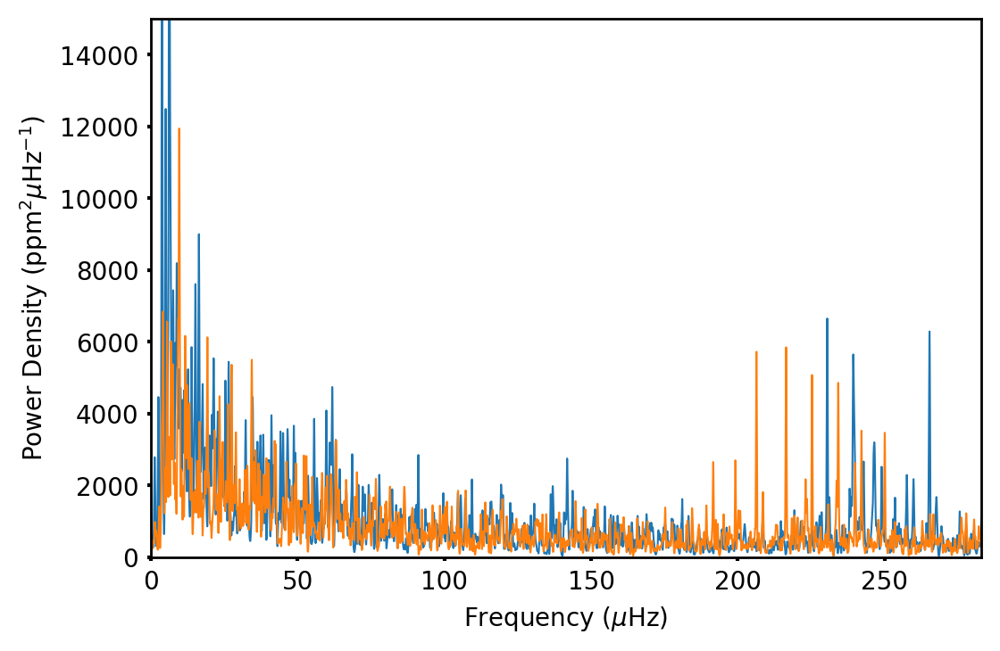

Best-fitting stellar parameters
zpt: 3.1503793803853548e-06

Best-fitting planet parameters for planet 0
period: 9.175849249312625
T0: 7.550316574192091
rprs: 0.03432777283151012

Best-fitting stellar parameters
zpt: 3.3450461535309497e-06

Best-fitting planet parameters for planet 0
period: 8.404036514308489
T0: 1.5091993487139157
rprs: 0.027063397829000725



/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


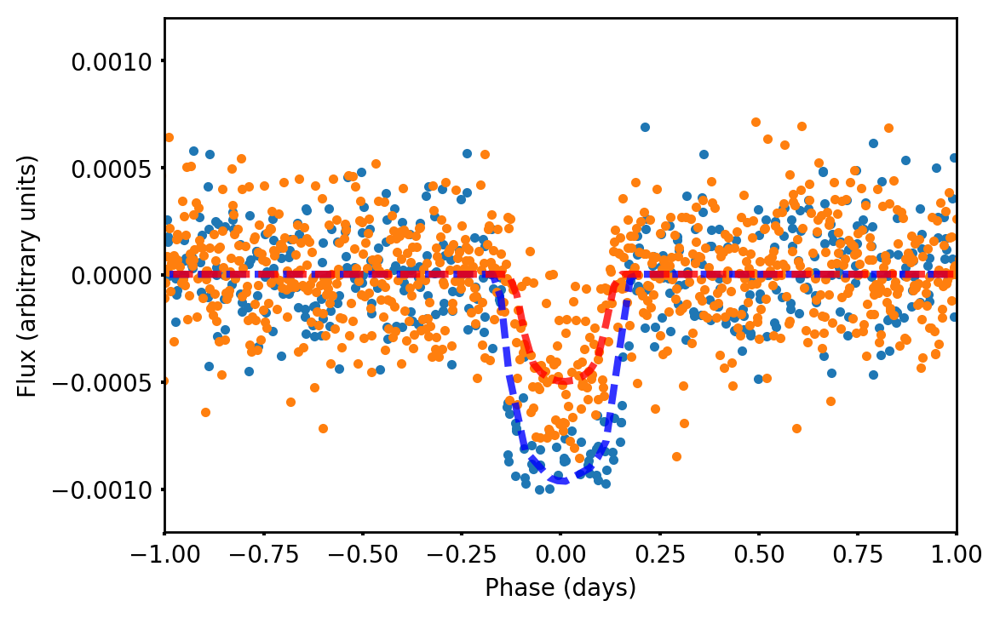

MCMC result:
amp = 44.57324530463248 +5.530136083148044 -4.394252158373234 
phase = 1.167462717778109 +0.1978981131420714 -0.21175163125348806
ln f = -1.3604249616331148 +0.34344050455854447 -0.35713581787137727
z = 7.595855219234784 +7.200285722908588 -6.1204463488120275
e = 1.1552754440321104e-06 +0.010274236970613169 -1.1552635076446118e-06

Mean acceptance fraction: 0.325


/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:378: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/samuelgrunblatt/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:379: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


MCMC result:
amp = 42.718359036514215 +5.7299137245401255 -6.305344926324395 
phase = 2.161227205562973 +0.12482185655142786 -0.1511635178329387
ln f = -1.069023054145032 +0.48151136232348735 -0.5020647030598504
z = -0.3673005837161534 +5.178299865211578 -3.924681921891882
e = 5.8696628409312646e-05 +0.0681294205345623 -5.8694701680637006e-05

Mean acceptance fraction: 0.285


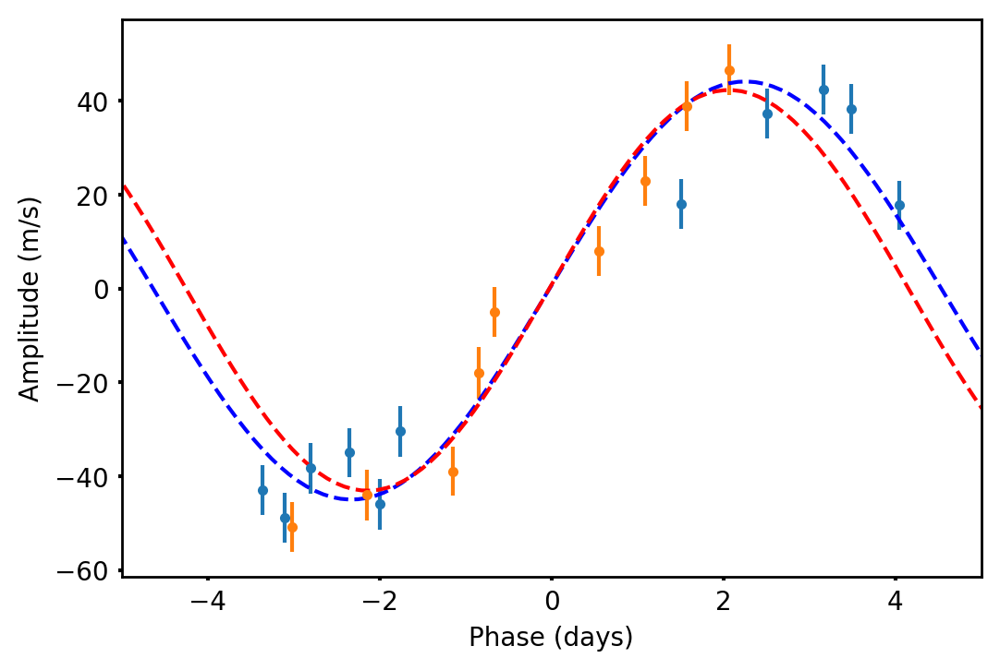

In [279]:
data = np.loadtxt('/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC228754001/228754001.dat.ts')
t = data[:,0]
y = (data[:,1]-1)# * 1e3
yerr = np.median(np.abs(np.diff(y)))
muhzconv = 1e6 / (3600*24)

def muhz2idays(muhz):
    return muhz / muhzconv

def muhz2omega(muhz):
    return muhz2idays(muhz) * 2.0 * np.pi

def idays2muhz(idays):
    return idays * muhzconv

def omega2muhz(omega):
    return idays2muhz(omega / (2.0 * np.pi))

omega = np.linspace(1, 1000, 1000)
freqmuhz = omega2muhz(omega)
freqidays = muhz2idays(freqmuhz)

#sigma clip and smooth if necessary
print("start lengths:", len(t), len(y))
#sigmaclip and remove nans
sigclip = 4.
loopsize = 10000
oldlentimes = len(t)+1
while oldlentimes > len(t):
    newtimes = np.array([])
    newfluxes = np.array([])
    j=0
    print(len(t) / loopsize + 1)
    while j < len(t) / loopsize + 1:
        dellist = []
        piecet = t[loopsize*j:loopsize*j+loopsize]
        piece = y[loopsize*j:loopsize*j+loopsize]
        #print piecet, piece
        for k in range(len(piece)):
            if abs(piece[k] - np.nanmean(piece)) > sigclip*np.nanstd(piece) or np.isnan(piece[k]) == True:
                #print "sigclip:",sigclip*np.nanstd(piece)
                #print "distance from mean:", piece[k] - np.nanmean(piece)
                dellist.append(k)
        #print dellist
        piecet = np.delete(piecet,dellist)
        piece = np.delete(piece,dellist)
        newtimes = np.append(newtimes, piecet)
        newfluxes = np.append(newfluxes, piece)
        #print sctimes[i], scfluxes[i]
        j=j+1
    print("new lens:", len(newtimes), len(newfluxes))
    oldlentimes = len(t)
    #print "oldlentimes:", oldlentimes
    t = newtimes
    y = newfluxes

#print len(times[i])
#times[i] = newtimes
#corrfluxes[i] = newfluxes
print("finish lengths:", len(t), len(y))

#median filter and remove outliers
y -= scipy.ndimage.filters.median_filter(y, size=80) #50 datapts ~ 1 day

#2287: remove edge effect during midcampaign break
edgemask = (t > 6.5) * (t < 22.5)
print(-edgemask)
t = t[-edgemask]
y = y[-edgemask]



from astropy.stats import LombScargle

#model = LombScargle(t, y*1e-3)
model = LombScargle(t, y)
power_ls = model.power(freqidays, method="fast", normalization="psd")
power_ls /= len(t)


#make LC, SC powspec
import lomb

osample=5.
nyq=283.
#nyq = 550

freq, amp, nout, jmax, prob = lomb.fasper(t,y, osample, 3.)
freq = 1000.*freq/86.4
binn = freq[1]-freq[0]
fts = 2.*amp*np.var(y)/(np.sum(amp)*binn)
fts = scipy.ndimage.filters.gaussian_filter(fts, 4)
use=np.where(freq < nyq+150)
freq=freq[use]
print(len(freq))
fts=fts[use]

plt.clf()
#plt.plot(freqmuhz,power_ls*2*np.pi*1e6, lw=0.75, color='k')
plt.plot(freq,fts*2*np.pi*1e12, lw=0.75)
#plt.xlim(150,300)
#plt.ylim(0,1500)
plt.ylabel(r'Power Density (ppm$^{2}\mu$Hz$^{-1}$)')
plt.xlabel(r'Frequency ($\mu$Hz)')
#plt.axes().set_aspect(0.027)
# plt.rcParams['xtick.major.size'] = 3
# plt.rcParams['xtick.major.width'] = 2
# plt.rcParams['xtick.minor.size'] = 3
# plt.rcParams['xtick.minor.width'] = 2
# plt.rcParams['ytick.major.size'] = 3
# plt.rcParams['ytick.major.width'] = 2
# plt.rcParams['ytick.minor.size'] = 3
# plt.rcParams['ytick.minor.width'] = 2
# plt.rcParams['axes.linewidth'] = 2

data = np.loadtxt('/Users/samuelgrunblatt/Desktop/reinflationpaper/K2-97/211351816.dat.ts')

t2 = data[:,0]
y2 = (data[:,1]-1)# * 1e3

#EPIC2287
#t = times - times[0]
#y = (flux-1) #* 1e3
#t = t[1:]
#y = y[1:] #even # of datapts


yerr2 = np.median(np.abs(np.diff(y2)))
muhzconv = 1e6 / (3600*24)

def muhz2idays(muhz):
    return muhz / muhzconv

def muhz2omega(muhz):
    return muhz2idays(muhz) * 2.0 * np.pi

def idays2muhz(idays):
    return idays * muhzconv

def omega2muhz(omega):
    return idays2muhz(omega / (2.0 * np.pi))

omega = np.linspace(1, 1000, 1000)
freqmuhz = omega2muhz(omega)
freqidays = muhz2idays(freqmuhz)
#sigma clip and smooth if necessary
print("start lengths:", len(t), len(y))
#sigmaclip and remove nans
sigclip = 3.5
loopsize = 10000
oldlentimes2 = len(t2)+1
while oldlentimes2 > len(t2):
    newtimes2 = np.array([])
    newfluxes2 = np.array([])
    j=0
    print(len(t2) / loopsize + 1)
    while j < len(t2) / loopsize + 1:
        dellist = []
        piecet = t2[loopsize*j:loopsize*j+loopsize]
        piece = y2[loopsize*j:loopsize*j+loopsize]
        #print piecet, piece
        for k in range(len(piece)):
            if abs(piece[k] - np.nanmean(piece)) > sigclip*np.nanstd(piece) or np.isnan(piece[k]) == True:
                #print "sigclip:",sigclip*np.nanstd(piece)
                #print "distance from mean:", piece[k] - np.nanmean(piece)
                dellist.append(k)
        #print dellist
        piecet = np.delete(piecet,dellist)
        piece = np.delete(piece,dellist)
        newtimes2 = np.append(newtimes2, piecet)
        newfluxes2 = np.append(newfluxes2, piece)
        #print sctimes[i], scfluxes[i]
        j=j+1
    print("new lens:", len(newtimes2), len(newfluxes2))
    oldlentimes2 = len(t2)
    #print "oldlentimes:", oldlentimes
    t2 = newtimes2
    y2 = newfluxes2

#print len(times[i])
#times[i] = newtimes
#corrfluxes[i] = newfluxes
print("finish lengths:", len(t2), len(y2))

#median filter and remove outliers
y2 -= scipy.ndimage.filters.median_filter(y2, size=80) #50 datapts ~ 1 day

#2287: remove edge effect during midcampaign break
#edgemask = (t > 6.5) * (t < 22.5)
#print(-edgemask)
#t = t[-edgemask]
#y = y[-edgemask]


#make LC, SC powspec
import lomb

osample=5.
nyq=283.
#nyq = 550

freq2, amp, nout, jmax, prob = lomb.fasper(t2,y2, osample, 3.)
freq2 = 1000.*freq2/86.4
binn = freq2[1]-freq2[0]
fts2 = 2.*amp*np.var(y2)/(np.sum(amp)*binn)
fts2 = scipy.ndimage.filters.gaussian_filter(fts2, 4)
use=np.where(freq2 < nyq+150)
freq2=freq2[use]
print(len(freq2))
fts2=fts2[use]

#plt.clf()
plt.plot(freq2, fts2*2*np.pi*1e12, lw=0.75)
plt.xlim(0,283)
plt.ylim(0,15000)
#plt.grid('.')
#plt.ylabel(r'Power Density (arbitrary units)') #(ppm$^{2}\mu$Hz$^{-1}$)')
#plt.xlabel(r'Frequency ($\mu$Hz)')
plt.show()
fig0 = plt.gcf()
fig0.savefig('/Users/samuelgrunblatt/Desktop/combopowspec.png')

#fit transit

from ktransit import FitTransit
import ktransit


fitT = FitTransit()

#K2-97
#fitT.add_guess_star(rho=0.02, zpt=0, ld1=0.6505,ld2=0.1041) 
#fitT.add_guess_planet(T0=1.5, period=8.406, impact=0.94, rprs=0.03) #simult, sff

#EPIC2287
fitT.add_guess_star(rho=0.025, zpt=0, ld1=0.6505,ld2=0.1041) 
fitT.add_guess_planet(T0=7.5, period=9.17, impact=0.88, rprs=0.03) #simult, sff

fitT.add_data(time=t,flux=np.array(y))#*1e-3)

vary_star = ['zpt']#, 'ld1', 'ld2']      # free stellar parameters
vary_planet = (['period',       # free planetary parameters
        'T0', #'impact',
        'rprs'])                # free planet parameters are the same for every planet you model

fitT.free_parameters(vary_star, vary_planet)
fitT.do_fit()                   # run the fitting

fitT.print_results()            # print some results

transmodel = fitT.transitmodel

fitT = FitTransit()
fitT.add_guess_star(rho=0.02, zpt=0, ld1=0.6505,ld2=0.1041) 
fitT.add_guess_planet(T0=1.5, period=8.406, impact=0.94, rprs=0.027) #simult, sff
fitT.add_data(time=t2,flux=np.array(y2))#*1e-3)

vary_star = ['zpt']#, 'ld1', 'ld2']      # free stellar parameters
vary_planet = (['period',       # free planetary parameters
        'T0', #'impact',
        'rprs'])                # free planet parameters are the same for every planet you model

fitT.free_parameters(vary_star, vary_planet)
fitT.do_fit()                   # run the fitting

fitT.print_results()            # print some results

transmodel2 = fitT.transitmodel

modelmask = (22 < t) * (t < 27)
modelmask2 = t2 < 8.406
tmod = t[modelmask]
tmod2 = t2[modelmask2]
#print(tmod,tmod2)

plt.clf()
plt.plot(t%9.175 - 7.545,y,'.')
plt.plot(t2%8.406 - 1.5, y2, '.')
plt.gca().set_color_cycle(None)
plt.plot(tmod%9.175 - 7.545,transmodel[modelmask], '--', lw=3, alpha=0.8, color='blue')
plt.plot(tmod2%8.406 - 1.5, transmodel2[modelmask2], '--', lw=3, alpha=0.8, color='red')
plt.xlim(-1,1)
plt.ylim(-0.0012,0.0012)
plt.xlabel('Phase (days)')
plt.ylabel('Flux (arbitrary units)')
plt.show()
fig1 = plt.gcf()
fig1.savefig('/Users/samuelgrunblatt/Desktop/combofoldtrans.png')

#rvfits
#read in data
data = np.genfromtxt('/Users/samuelgrunblatt/Desktop/reinflationpaper/rvlog.txt')

#times are BJD with 2.44e6 factor
times2011 = data[:4,2] + 2.44e6
rvs2011 = data[:4,3]
rverrs2011 = np.sqrt(data[:4,4]**2 + 15**2) #add error for stellar jitter
times2287 = data[4:15,2] + 2.44e6
rvs2287 = data[4:15,3]
rverrs2287 = np.sqrt(data[4:15,4]**2 + 5**2)
times2113 = data[15:,2] + 2.44e6
rvs2113 = data[15:,3]
rverrs2113 = np.sqrt(data[15:,4]**2 + 5**2)

per2011 = 8.66
per2287 = 9.17
per2113 = 8.406

#modtimes = (times-times[0]) % per
#print modtimes

#plt.axvline(2457852.9583%per2011, color='r') #April 8th/9th at midnight HST
#plt.axvline(2457853.9583%per2011, color='r')
#plt.axvspan(2457852.9583%per2011, 2457853.9583%per2011)
#plt.errorbar(times2011 % per2011, rvs2011, rverrs2011, fmt='o')
#plt.plot(100*np.sin(np.sort(modtimes*8.41/(2*np.pi))))
xpred = np.r_[0:10:200j]
#plt.plot(xpred,25*np.sin(xpred*2*np.pi/per2011)/(1+0.5*np.sin(xpred*2*np.pi/per2011)))
#plt.show()

def lnprior(theta):
    amp, phase, lnf, zpt, e = theta
    if 0 < amp < 100 and 0 < phase < 10 and -10.0 < lnf < 10.0 and -100 < zpt < 100 and 0.0 < e < 1. :
        return 0.0 + np.log(1./e)
    return -np.inf

def lnlike(theta, x, y, yerr):
    amp, phase, lnf, zpt, e = theta
    model = zpt+(amp*np.sin(x*2*np.pi/per2287 + phase)/(1+e*np.sin(x*2*np.pi/per2287 + phase)))
    inv_sigma2 = 1.0/(yerr**2 + model**2*np.exp(2*lnf)) #5**2 is stellar jitter term
    return -0.5*(np.sum((y-model)**2*inv_sigma2 - np.log(inv_sigma2)))

def lnlike2(theta, x, y, yerr):
    amp, phase, lnf, zpt, e = theta
    model = zpt+(amp*np.sin(x*2*np.pi/per2113 + phase)/(1+e*np.sin(x*2*np.pi/per2113 + phase)))
    inv_sigma2 = 1.0/(yerr**2 + model**2*np.exp(2*lnf)) #5**2 is stellar jitter term
    return -0.5*(np.sum((y-model)**2*inv_sigma2 - np.log(inv_sigma2)))

def lnprob2(theta, x, y, yerr):
    lp = lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    #print(lp+lnlike(theta,x,y,yerr))
    return lp + lnlike2(theta, x, y, yerr)

def lnprob(theta, x, y, yerr):
    lp = lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    #print(lp+lnlike(theta,x,y,yerr))
    return lp + lnlike(theta, x, y, yerr)

ndim, nwalkers = 5, 100
pos = [[38, 1.5, -1., 21.0, 0.28] + 1e-4*np.random.randn(ndim) for i in range(nwalkers)]

import emcee
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(times2287, rvs2287, rverrs2287))

sampler.run_mcmc(pos, 10000)
burnin = 1000
samples = sampler.chain[:, burnin:, :].reshape((-1, ndim))

[amp_mcmc, phase_mcmc, lnf_mcmc, zpt_mcmc, e_mcmc] = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                             zip(*np.percentile(samples, [16, 50, 84], axis=0)))
print("""MCMC result:
amp = {0[0]} +{0[1]} -{0[2]} 
phase = {1[0]} +{1[1]} -{1[2]}
ln f = {2[0]} +{2[1]} -{2[2]}
z = {3[0]} +{3[1]} -{3[2]}
e = {4[0]} +{4[1]} -{4[2]}
""".format(amp_mcmc, phase_mcmc, lnf_mcmc, zpt_mcmc, e_mcmc))
print("Mean acceptance fraction: {0:.3f}"
        .format(np.mean(sampler.acceptance_fraction)))


modtimes = times2287%per2287 - 7.5
for i in modtimes:
    if abs(modtimes[i]) > 5:
        modtimes[i] = modtimes[i] + per2287
plt.clf()
#ax = fig.add_subplot(111)
#ax.set_aspect(0.03)
plt.errorbar(modtimes, rvs2287-8, rverrs2287, fmt='.')
xpred = np.r_[-5:15:200j]
#plt.legend(('Keck', 'APF'), loc=3)
plt.plot(xpred-7.5,zpt_mcmc[0]-8+amp_mcmc[0]*np.sin(xpred*2*np.pi/per2287+phase_mcmc[0])/(1+e_mcmc[0]*np.sin(xpred*2*np.pi/per2287 + phase_mcmc[0])), '--', c='blue')
#plt.ylim(-110,160)

sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob2, args=(times2113, rvs2113, rverrs2113))

sampler.run_mcmc(pos, 10000)
burnin = 1000
samples = sampler.chain[:, burnin:, :].reshape((-1, ndim))

[amp_mcmc, phase_mcmc, lnf_mcmc, zpt_mcmc, e_mcmc] = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                             zip(*np.percentile(samples, [16, 50, 84], axis=0)))
print("""MCMC result:
amp = {0[0]} +{0[1]} -{0[2]} 
phase = {1[0]} +{1[1]} -{1[2]}
ln f = {2[0]} +{2[1]} -{2[2]}
z = {3[0]} +{3[1]} -{3[2]}
e = {4[0]} +{4[1]} -{4[2]}
""".format(amp_mcmc, phase_mcmc, lnf_mcmc, zpt_mcmc, e_mcmc))
print("Mean acceptance fraction: {0:.3f}"
        .format(np.mean(sampler.acceptance_fraction)))


plt.errorbar(times2113%per2113-5.55, rvs2113, rverrs2113, fmt='.')
xpred = np.r_[-5:15:200j]
#plt.legend(('Keck', 'APF'), loc=3)
plt.plot(xpred-5.55,zpt_mcmc[0]+amp_mcmc[0]*np.sin(xpred*2*np.pi/per2113+phase_mcmc[0])/(1+e_mcmc[0]*np.sin(xpred*2*np.pi/per2113 + phase_mcmc[0])), '--', c='red')

plt.xlim(-5, 5)
plt.xlabel('Phase (days)')
plt.ylabel('Amplitude (m/s)')

#add test obs points
#plt.axvspan(2457852.9583%per2287, 2457853.208333%per2287, alpha=0.5, color='g') #April 8th/9th from midnight to 6am HST
#plt.axvspan(2457853.75%per2287, 2457854.208333%per2287, alpha=0.5, color='g') #April 9th from 7pm to 10th at 6am HST
#plt.axvspan(2457854.75%per2287, 2457855.208333%per2287, alpha=0.5, color='g') #April 10th at 7pm HST to 11th at 6am HST

#plt.subplots_adjust(left=0.16, bottom=0.09, right=0.94, top=0.96, wspace=0.2, \
#        hspace=0.25)
plt.savefig('/Users/samuelgrunblatt/Desktop/rvscombo.png')
plt.show()

In [358]:
muhz2omega(250)

135.71680263507906

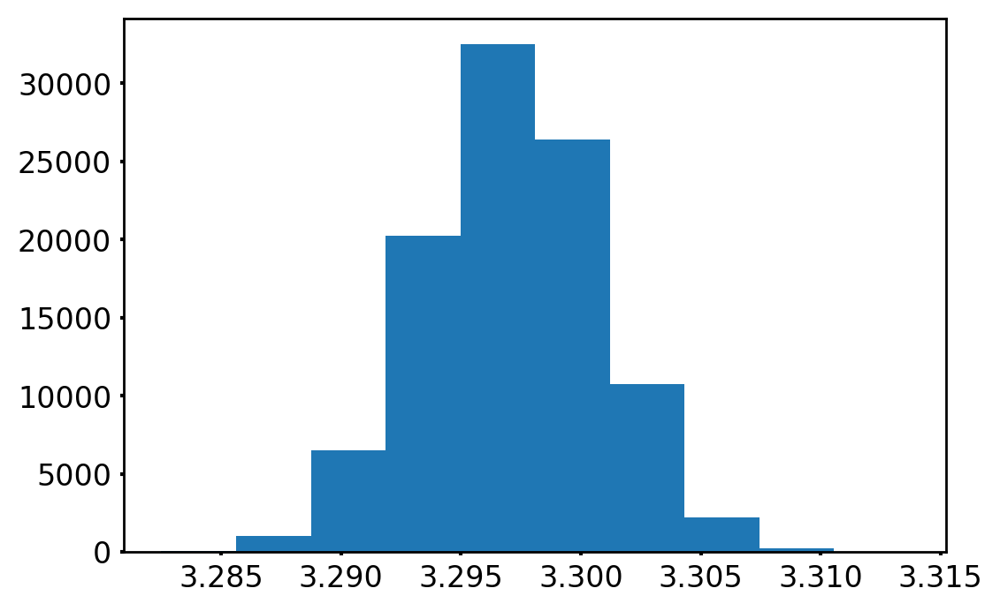

In [424]:
Teff = 60*np.random.randn(100000) + 4840.
FeH = 0.04*np.random.randn(100000) - 0.01
numax = 1.4*np.random.randn(100000) + 244.8
dnu = 0.08*np.random.randn(100000) + 18.48

Teffsun = 5777
numaxsun = 3100
dnusun = 135

Mstar = np.zeros_like(Teff)
Rstar = np.zeros_like(Teff)
rhostar = np.zeros_like(Teff)
logg = np.zeros_like(Teff)

for i in range (len(Teff)):
    Mstar[i] = (numax[i] / numaxsun)**3 * (dnu[i] / dnusun)**(-4) * (Teff[i] / Teffsun)**(3/2)
    Rstar[i] = (numax[i] / numaxsun) * (dnu[i] / dnusun)**(-2) * (Teff[i] / Teffsun)**(1/2)
    rhostar[i] = 1.41 * (Mstar[i] / Rstar[i]**3)
    logg[i] = 4.43812 + np.log10(Mstar[i] / Rstar[i]**2)

plt.hist(logg)
plt.show()

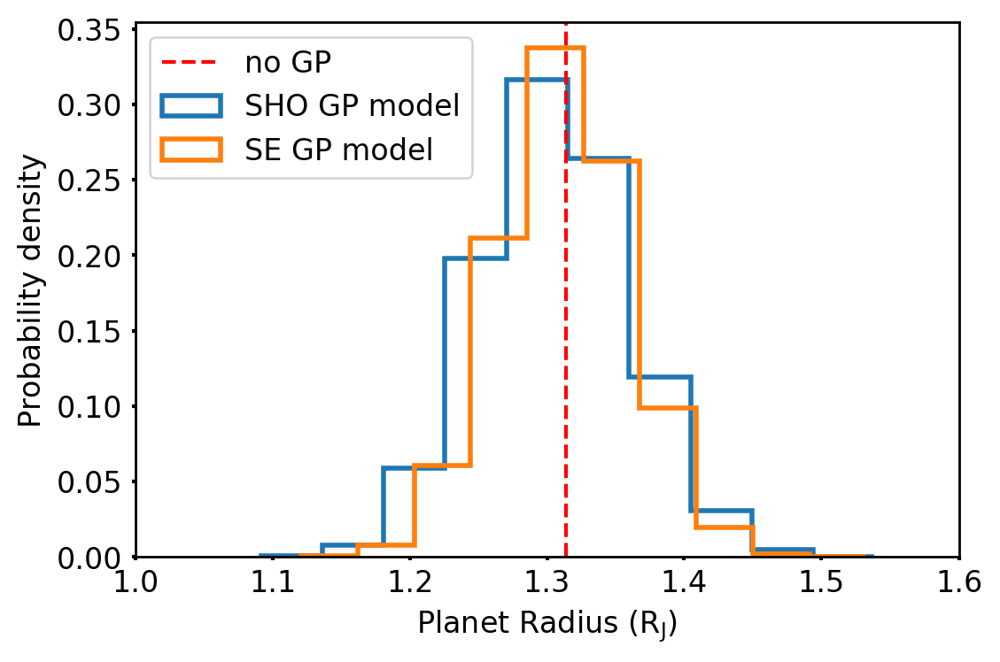

[ 0.00043694  0.00787973  0.05853514  0.19789676  0.31638895  0.26385988
  0.11904021  0.03083019  0.00480634  0.00032585] [ 1.09167243  1.13637466  1.18107689  1.22577911  1.27048134  1.31518357
  1.3598858   1.40458803  1.44929025  1.49399248  1.53869471]
[  4.66480075e-04   7.81020925e-03   6.04958017e-02   2.11128882e-01
   3.37518326e-01   2.62428362e-01   9.89604158e-02   1.92456351e-02
   1.87924830e-03   6.66400107e-05] [ 1.12104283  1.16214609  1.20324935  1.24435261  1.28545587  1.32655913
  1.36766238  1.40876564  1.4498689   1.49097216  1.53207542]
1.0 1.0
disagreement: [ 0.9999998   0.99999291  0.99988472  0.99888157  0.99295455  0.97030125
  0.91509396  0.83335137  0.77218117  0.78015208  0.84854582  0.92474366
  0.97275208  0.99276978  0.99860421  0.99980938  0.99998264  0.99999907
  0.99999998]
1.0


In [150]:
Rpse = np.loadtxt('/Users/samuelgrunblatt/Desktop/reinflationpaper/EPIC228754001/2287SEGPrads.txt')
Rpseweight = np.ones_like(Rpse)/len(Rpse)
Rpweight = np.ones_like(Rp)/len(Rp)
n, bins, patches = plt.hist(Rp, label='SHO GP model', lw=2, histtype='step', weights=Rpweight)
n2, bins2, patches2 =  plt.hist(Rpse, label='SE GP model', lw=2, histtype='step', weights=Rpseweight)
plt.axvline(0.03511 *3.85 * 6.95e5 / 71492, color='r', ls='--', label='no GP')
plt.legend(loc=2)
plt.xlabel(r'Planet Radius (R$_\mathrm{J}$)')
plt.ylabel('Probability density')
plt.xlim(1.0,1.6)
plt.show()


print(n, bins)
print(n2, bins2)
print(np.sum(n), np.sum(n2))
agreement = np.convolve(n, n2)
plt.clf()
#plt.hist(1.-agreement)
print("disagreement:", 1.-agreement)
print(np.sum(agreement))

In [27]:
#2287
Teff = np.sqrt(60**2+59**2)*np.random.randn(len(lnrprssamples)) + 4840. #add errors of Torres et al in quadrature
FeH = np.sqrt(0.04**2+0.062**2)*np.random.randn(len(lnrprssamples)) - 0.01
numax = 3.3*np.random.randn(len(lnrprssamples)) + 245.65 #inflate errors?
dnu = 0.26*np.random.randn(len(lnrprssamples)) + 18.48
fdnu = 0.998

#K2-97
#Teff = 90*np.random.randn(len(lnrprssamples)) + 4790. #add errors of Torres et al in quadrature
#FeH = 0.08*np.random.randn(len(lnrprssamples)) +0.42
#numax = 5.4*np.random.randn(len(lnrprssamples)) + 223.7 #inflate errors?
#dnu = 0.17*np.random.randn(len(lnrprssamples)) + 16.83
#fdnu = 0.994

#2011
#Teff = 60*np.random.randn(len(lnrprssamples)) + 4800. #add errors of Torres et al in quadrature
#FeH = 0.04*np.random.randn(len(lnrprssamples)) - 0.29
#numax = 3.3*np.random.randn(len(lnrprssamples)) + 47.65 #inflate errors?
#dnu = 0.26*np.random.randn(len(lnrprssamples)) + 5.34


Teffsun = 5777
numaxsun = 3100
dnusun = 135


Mstar = np.zeros_like(Teff)
Rstar = np.zeros_like(Teff)
rhostar = np.zeros_like(Teff)
logg = np.zeros_like(Teff)
Rp = np.zeros_like(lnrprssamples)

for i in range (len(Teff)):
    Mstar[i] = (numax[i] / numaxsun)**3 * (dnu[i] / (fdnu*dnusun))**(-4) * (Teff[i] / Teffsun)**(3/2)
    Rstar[i] = (numax[i] / numaxsun) * (dnu[i] / (fdnu*dnusun))**(-2) * (Teff[i] / Teffsun)**(1/2)
    rhostar[i] = 1.41 * (Mstar[i] / Rstar[i]**3)
    logg[i] = 4.43812 + np.log10(Mstar[i] / Rstar[i]**2)

print('Teff: ', np.percentile(Teff, 50), ' + ', np.percentile(Teff, 84.1)- np.percentile(Teff,50), ' - ', np.percentile(Teff,50) - np.percentile(Teff,14.9))
print('FeH: ', np.percentile(FeH, 50), ' + ', np.percentile(FeH, 84.1)- np.percentile(FeH,50), ' - ', np.percentile(FeH,50) - np.percentile(FeH,14.9))
print('Mstar: ', np.percentile(Mstar, 50), ' + ', np.percentile(Mstar, 84.1)- np.percentile(Mstar,50), ' - ', np.percentile(Mstar,50) - np.percentile(Mstar,14.9))
print('Rstar: ', np.percentile(Rstar, 50), ' + ', np.percentile(Rstar, 84.1)- np.percentile(Rstar,50), ' - ', np.percentile(Rstar,50) - np.percentile(Rstar,14.9))
print('rhostar: ', np.percentile(rhostar, 50), ' + ', np.percentile(rhostar, 84.1)- np.percentile(rhostar,50), ' - ', np.percentile(rhostar,50) - np.percentile(rhostar,14.9))
print('logg: ', np.percentile(logg, 50), ' + ', np.percentile(logg, 84.1)- np.percentile(logg,50), ' - ', np.percentile(logg,50) - np.percentile(logg,14.9))


Teff:  4839.76036422  +  83.8278581287  -  87.6965534463
FeH:  -0.00998955295048  +  0.0741799619912  -  0.0761305376712
Mstar:  1.07768956331  +  0.0826820628775  -  0.0795362508439
Rstar:  3.85450758579  +  0.127830446836  -  0.126647880853
rhostar:  0.0265293473132  +  0.000750661010708  -  0.000779170598527
logg:  3.29856850424  +  0.00692083144316  -  0.00726194282773


In [107]:
np.e

2.718281828459045